# Clustering Evaluation Under Noise

Dieses Notebook implementiert den kompletten Versuchsplan zur Untersuchung des Einflusses von Rauschen auf Clusterqualitaet und Clusterstabilitaet.

Abgedeckt werden:
- Basisszenario ohne Rauschen
- Ausreisser-Szenarien mit und ohne gezielte Vorverarbeitung
- Zwischencluster-Ausreisser mit und ohne gezielte Vorverarbeitung
- Szenarien mit irrelevanten Merkmalen mit und ohne gezielte Vorverarbeitung
- Vergleich von k-Means, hierarchischem Clustering, DBSCAN und RTKM
- Qualitaetsbewertung mit Silhouette und Davies-Bouldin
- Stabilitaetsbewertung ueber mittleren paarweisen ARI
- Aggregation, Visualisierung und Export der Ergebnisse

Wichtige Regel: Die Clusterverfahren arbeiten immer auf dem vollstaendigen Datensatz der jeweiligen Variante. Eine 2D-Projektion per PCA dient ausschliesslich der Visualisierung.


In [1]:
import sys
from pathlib import Path
import json
import warnings
import importlib.metadata as importlib_metadata
from itertools import combinations

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.cluster.hierarchy import dendrogram
from scipy.spatial.distance import cdist
from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

candidate_root = Path.cwd().resolve()
project_root = candidate_root if (candidate_root / "libs").exists() else candidate_root.parent
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

from libs.RTKM_paper import RTKM
from libs.laplacian_score import laplacian_score
from noise_aware_metrics import modified_silhouette_score

warnings.filterwarnings("ignore", category=UserWarning)
try:
    plt.style.use("seaborn-v0_8-whitegrid")
except OSError:
    pass

plt.rcParams.update(
    {
        "figure.figsize": (7.0, 5.0),
        "figure.dpi": 150,
        "savefig.dpi": 300,
        "savefig.format": "svg",
        "font.family": "serif",
        "font.size": 11,
        "axes.titlesize": 12,
        "axes.labelsize": 11,
        "axes.titleweight": "bold",
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": True,
        "grid.alpha": 0.25,
        "grid.linestyle": "--",
        "legend.frameon": False,
        "legend.fontsize": 9,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "lines.linewidth": 2.0,
    }
)

CONFIG = {
    "n_samples": 1000,
    "centers": 3,
    "n_features": 10,
    "cluster_std": 1.0,
    "random_state": 42,
    "noise_levels": [10, 20, 30],
    "methods": ["kmeans", "hierarchisch", "dbscan", "rtkm"],
    "repetitions": 20,
    "kmeans_n_init": 20,
    "kmeans_init": "k-means++",
    "n_clusters": 3,
    "hierarchical_linkage": "ward",
    "pca_random_state": 42,
    "dbscan_reference_seed": 2026,
    "rtkm_alpha_by_level": {10: 0.091, 20: 0.167, 30: 0.231},
    "intercluster_margin_preprocessing": {
        "k": 3,
        "kmeans_init": "k-means++",
        "kmeans_n_init": 20,
        "calibration_random_state": 42,
        "quantile": 0.01,
        "epsilon": 1e-12,
    },
}

REPEAT_SEEDS = [
    101, 102, 103, 104, 105,
    106, 107, 108, 109, 110,
    111, 112, 113, 114, 115,
    116, 117, 118, 119, 120,
]

METHOD_SEED_OFFSETS = {
    "kmeans": 11,
    "hierarchisch": 23,
    "dbscan": 37,
    "rtkm": 53,
}

BASE_FEATURE_NAMES = [f"feature_{idx:02d}" for idx in range(CONFIG["n_features"])]
BASE_OBSERVATION_IDS = np.arange(CONFIG["n_samples"])

RESULTS_DIR = project_root / "results" / "clustering_evaluation"
FIGURES_DIR = RESULTS_DIR / "figures"
TABLES_DIR = RESULTS_DIR / "tables"
for path in (RESULTS_DIR, FIGURES_DIR, TABLES_DIR):
    path.mkdir(parents=True, exist_ok=True)

EXPORT_FORMAT = "svg"
METHOD_DISPLAY_NAMES = {
    "kmeans": "k-Means",
    "hierarchisch": "Hierarchisch",
    "dbscan": "DBSCAN",
    "rtkm": "RTKM",
}
METHOD_COLORS = {
    "kmeans": "#1b9e77",
    "hierarchisch": "#d95f02",
    "dbscan": "#7570b3",
    "rtkm": "#e7298a",
}
METHOD_MARKERS = {
    "kmeans": "o",
    "hierarchisch": "s",
    "dbscan": "^",
    "rtkm": "D",
}
METHOD_LINESTYLES = {
    "kmeans": "-",
    "hierarchisch": "--",
    "dbscan": "-.",
    "rtkm": ":",
}
METHOD_X_OFFSETS = {
    "kmeans": -0.9,
    "hierarchisch": -0.3,
    "dbscan": 0.3,
    "rtkm": 0.9,
}
CLUSTER_PALETTE = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]
NOISE_COLOR = "#222222"

print(f"Projektwurzel: {project_root}")
print(f"Ergebnisverzeichnis: {RESULTS_DIR}")
print(f"Anzahl Wiederholungen: {CONFIG['repetitions']}")

Projektwurzel: /Users/max/workspace/clust-methods-noise-eval
Ergebnisverzeichnis: /Users/max/workspace/clust-methods-noise-eval/results/clustering_evaluation
Anzahl Wiederholungen: 20


## Basisdatensatz und visuelle Grundfunktionen

Der Basisdatensatz wird genau einmal erzeugt. Die originalen Clusterlabels werden nur fuer interne Kontrolle gespeichert. Fuer alle Plots wird eine PCA-Projektion in zwei Dimensionen genutzt.

Basisdatensatz: 1000 Beobachtungen x 10 Merkmale
Die PCA-Projektion unten dient ausschliesslich der Visualisierung.


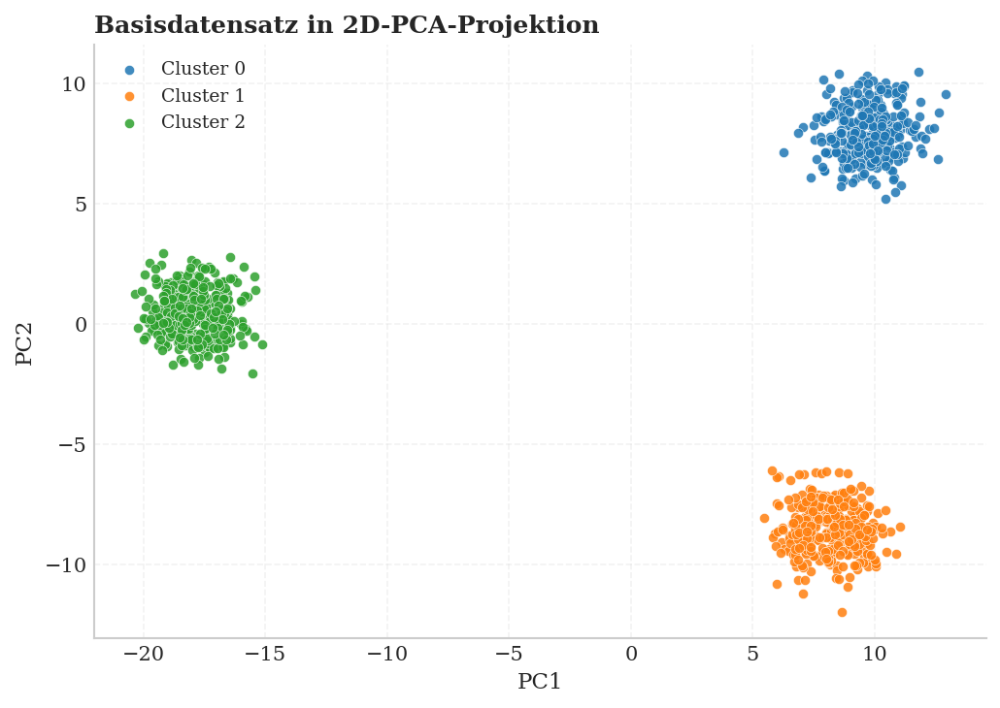

,observation_id,is_base_observation,true_label
0,0,True,1
1,1,True,1
2,2,True,0
3,3,True,0
4,4,True,1


In [2]:
def make_figure_path(stem):
    return FIGURES_DIR / f"{stem}.{EXPORT_FORMAT}"


def save_figure(fig, save_path=None):
    if save_path is not None:
        fig.savefig(save_path, format=Path(save_path).suffix.lstrip("."), bbox_inches="tight")


def finalize_figure(fig, save_path=None):
    fig.tight_layout()
    save_figure(fig, save_path=save_path)
    plt.show()


def project_to_2d(X):
    X = np.asarray(X)
    return PCA(n_components=2, random_state=CONFIG["pca_random_state"]).fit_transform(X)


def plot_projection(X, labels=None, title="Datensatzprojektion", ax=None, save_path=None):
    X_2d = project_to_2d(X)
    created_fig = False
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 5))
        created_fig = True
    else:
        fig = ax.figure

    if labels is None:
        ax.scatter(X_2d[:, 0], X_2d[:, 1], s=24, alpha=0.85, color="#4c78a8", edgecolors="white", linewidths=0.3)
    else:
        labels = np.asarray(labels)
        unique_labels = np.unique(labels)
        for idx, label in enumerate(unique_labels):
            mask = labels == label
            color = NOISE_COLOR if label == -1 else CLUSTER_PALETTE[idx % len(CLUSTER_PALETTE)]
            name = "Noise/Outlier" if label == -1 else f"Cluster {label}"
            ax.scatter(
                X_2d[mask, 0],
                X_2d[mask, 1],
                s=24,
                alpha=0.85,
                color=color,
                edgecolors="white",
                linewidths=0.3,
                label=name,
            )
        ax.legend(loc="best", ncol=1)

    ax.set_title(title, loc="left")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")

    if created_fig:
        finalize_figure(fig, save_path=save_path)


X_base, y_base = make_blobs(
    n_samples=CONFIG["n_samples"],
    centers=CONFIG["centers"],
    n_features=CONFIG["n_features"],
    cluster_std=CONFIG["cluster_std"],
    random_state=CONFIG["random_state"],
)

base_observation_metadata = pd.DataFrame(
    {
        "observation_id": BASE_OBSERVATION_IDS,
        "is_base_observation": True,
        "true_label": y_base,
    }
)

base_feature_metadata = pd.DataFrame(
    {
        "feature_name": BASE_FEATURE_NAMES,
        "is_artificial_feature": False,
    }
)

print(f"Basisdatensatz: {X_base.shape[0]} Beobachtungen x {X_base.shape[1]} Merkmale")
print("Die PCA-Projektion unten dient ausschliesslich der Visualisierung.")
plot_projection(
    X_base,
    labels=y_base,
    title="Basisdatensatz in 2D-PCA-Projektion",
    save_path=make_figure_path("basisdatensatz_pca"),
)

base_observation_metadata.head()

## Rauscherzeugung, Vorverarbeitung und DBSCAN-Kalibrierung

Hier werden die Datensatzvarianten aufgebaut. Fuer Ausreisser, Zwischencluster-Ausreisser, irrelevante Merkmale und Vorverarbeitung werden die vorhandenen Bausteine aus dem anderen Notebook uebernommen oder repo-konsistent erweitert. Die Vorverarbeitung erfolgt dabei ueber IQR-basiertes Entfernen auffaelliger Beobachtungen sowie Laplacian-Score-basierte Merkmalsauswahl.

DBSCAN wird pro Dimensionalitaet einmal auf einer sauberen Referenzvariante kalibriert. `min_samples = 2d`, `eps` wird ueber eine k-distance-Kurve mit einfacher Knee-Heuristik bestimmt.


Dimensionalitaet 10: Geschaetzter eps-Wert = 1.304643
Dimensionalitaet 10: Knickpunkt-Index = 996
Dimensionalitaet 11: Geschaetzter eps-Wert = 1.824045
Dimensionalitaet 11: Knickpunkt-Index = 995
Dimensionalitaet 12: Geschaetzter eps-Wert = 2.534762
Dimensionalitaet 12: Knickpunkt-Index = 998
Dimensionalitaet 13: Geschaetzter eps-Wert = 2.894662
Dimensionalitaet 13: Knickpunkt-Index = 997


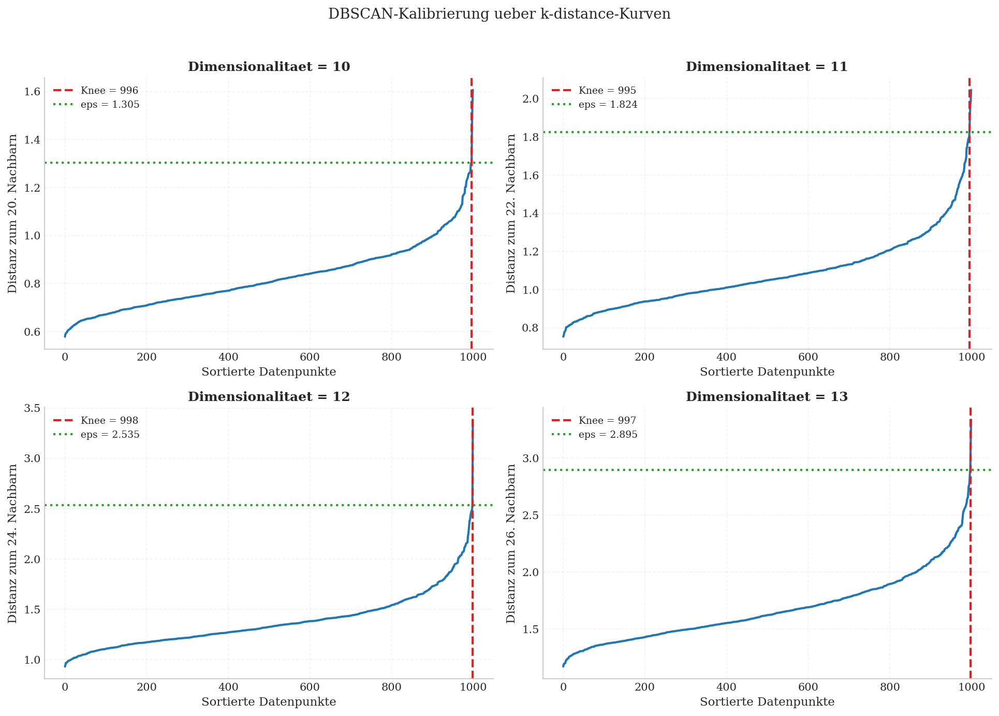

Kalibrierter Margin-Schwellenwert fuer Zwischencluster-Ausreisser: 0.737163


,dimensionalitaet,eps,min_samples,knee_index
0,10,1.304643,20,996
1,11,1.824045,22,995
2,12,2.534762,24,998
3,13,2.894662,26,997


In [3]:
def number_of_irrelevant_features(noise_level_percent):
    return int(noise_level_percent / 10)


def add_outliers(X, noise_level_percent, seed, min_distance_factor=2.5):
    """Uebernommen aus dem bestehenden Notebook und leicht an die Variant-Struktur angepasst."""
    rng = np.random.default_rng(seed)
    n_noise = int((noise_level_percent / 100) * X.shape[0])

    if n_noise == 0:
        X_augmented = X.copy()
        observation_ids = BASE_OBSERVATION_IDS.copy()
        is_base_observation = np.ones(X.shape[0], dtype=bool)
    else:
        center = X.mean(axis=0)
        dists = np.linalg.norm(X - center, axis=1)
        typical_radius = np.percentile(dists, 95)

        noise_points = []
        while len(noise_points) < n_noise:
            candidates = rng.normal(loc=center, scale=X.std(axis=0) * 3, size=(n_noise, X.shape[1]))
            candidate_dists = np.linalg.norm(candidates - center, axis=1)
            valid = candidates[candidate_dists > min_distance_factor * typical_radius]
            noise_points.extend(valid.tolist())

        X_noise = np.asarray(noise_points[:n_noise])
        X_augmented = np.vstack([X, X_noise])
        observation_ids = np.concatenate([BASE_OBSERVATION_IDS, CONFIG["n_samples"] + np.arange(n_noise)])
        is_base_observation = np.concatenate([
            np.ones(X.shape[0], dtype=bool),
            np.zeros(n_noise, dtype=bool),
        ])

    return {
        "X": X_augmented,
        "observation_ids": observation_ids,
        "is_base_observation": is_base_observation,
        "feature_names": BASE_FEATURE_NAMES.copy(),
        "is_artificial_feature": np.zeros(len(BASE_FEATURE_NAMES), dtype=bool),
    }


def add_intercluster_outliers(
    X,
    y,
    noise_level_percent,
    seed,
    lambda_min=0.20,
    jitter_scale=0.35,
    exclusion_radius_factor=1.0,
):
    rng = np.random.default_rng(seed)
    n_noise = int((noise_level_percent / 100) * X.shape[0])

    if n_noise == 0:
        return {
            "X": X.copy(),
            "observation_ids": BASE_OBSERVATION_IDS.copy(),
            "is_base_observation": np.ones(X.shape[0], dtype=bool),
            "feature_names": BASE_FEATURE_NAMES.copy(),
            "is_artificial_feature": np.zeros(len(BASE_FEATURE_NAMES), dtype=bool),
            "intercluster_sampling_attempts": 0,
            "intercluster_sampling_acceptance_rate": np.nan,
            "intercluster_generated_cluster_pairs": [],
            "intercluster_lambda_values": [],
            "intercluster_attempts_per_point": [],
        }

    unique_labels = np.unique(y)
    centroids = {
        label: X[y == label].mean(axis=0)
        for label in unique_labels
    }
    cluster_radii = {
        label: np.percentile(
            np.linalg.norm(X[y == label] - centroids[label], axis=1),
            95,
        )
        for label in unique_labels
    }
    cluster_pairs = list(combinations(unique_labels.tolist(), 2))
    if not cluster_pairs:
        raise ValueError("Zwischencluster-Ausreisser benoetigen mindestens zwei Cluster.")

    feature_std = np.std(X, axis=0)
    feature_std = np.where(feature_std > 0, feature_std, 1.0)
    pair_schedule = [cluster_pairs[idx % len(cluster_pairs)] for idx in range(n_noise)]
    rng.shuffle(pair_schedule)

    noise_points = []
    generated_cluster_pairs = []
    lambda_values = []
    attempts_per_point = []
    total_attempts = 0
    max_attempts_per_point = 250

    for label_a, label_b in pair_schedule:
        accepted = False
        for attempt in range(1, max_attempts_per_point + 1):
            total_attempts += 1
            lambda_value = rng.uniform(lambda_min, 1.0 - lambda_min)
            base_point = (
                lambda_value * centroids[label_a]
                + (1.0 - lambda_value) * centroids[label_b]
            )
            jitter = rng.normal(
                loc=0.0,
                scale=feature_std * jitter_scale,
                size=X.shape[1],
            )
            candidate = base_point + jitter
            is_outside_cluster_cores = all(
                np.linalg.norm(candidate - centroids[label])
                > exclusion_radius_factor * cluster_radii[label]
                for label in unique_labels
            )
            if is_outside_cluster_cores:
                noise_points.append(candidate)
                generated_cluster_pairs.append((int(label_a), int(label_b)))
                lambda_values.append(float(lambda_value))
                attempts_per_point.append(attempt)
                accepted = True
                break

        if not accepted:
            raise ValueError(
                "Inter-Cluster-Noise konnte mit den aktuellen Sampling-Parametern nicht stabil erzeugt werden."
            )

    X_noise = np.asarray(noise_points)
    X_augmented = np.vstack([X, X_noise])
    observation_ids = np.concatenate([BASE_OBSERVATION_IDS, CONFIG["n_samples"] + np.arange(n_noise)])
    is_base_observation = np.concatenate([
        np.ones(X.shape[0], dtype=bool),
        np.zeros(n_noise, dtype=bool),
    ])

    return {
        "X": X_augmented,
        "observation_ids": observation_ids,
        "is_base_observation": is_base_observation,
        "feature_names": BASE_FEATURE_NAMES.copy(),
        "is_artificial_feature": np.zeros(len(BASE_FEATURE_NAMES), dtype=bool),
        "intercluster_sampling_attempts": int(total_attempts),
        "intercluster_sampling_acceptance_rate": float(n_noise / total_attempts),
        "intercluster_generated_cluster_pairs": generated_cluster_pairs,
        "intercluster_lambda_values": lambda_values,
        "intercluster_attempts_per_point": attempts_per_point,
    }


def add_irrelevant_features(X, noise_level_percent, seed):
    """Uebernommen aus dem bestehenden Notebook und um Metadaten erweitert."""
    rng = np.random.default_rng(seed)
    n_irrelevant = number_of_irrelevant_features(noise_level_percent)
    mean = np.mean(X, axis=0).mean()
    std = np.std(X, axis=0).mean()
    irrelevant = rng.normal(loc=mean, scale=std, size=(X.shape[0], n_irrelevant))

    feature_names = BASE_FEATURE_NAMES.copy() + [f"irrelevant_{idx + 1:02d}" for idx in range(n_irrelevant)]
    is_artificial_feature = np.concatenate([
        np.zeros(len(BASE_FEATURE_NAMES), dtype=bool),
        np.ones(n_irrelevant, dtype=bool),
    ])

    return {
        "X": np.hstack([X, irrelevant]),
        "observation_ids": BASE_OBSERVATION_IDS.copy(),
        "is_base_observation": np.ones(CONFIG["n_samples"], dtype=bool),
        "feature_names": feature_names,
        "is_artificial_feature": is_artificial_feature,
    }


def remove_outliers_iqr(X, multiplier=1.5, min_features_outside=2):
    """Uebernommen aus dem bestehenden Notebook."""
    Q1 = np.percentile(X, 25, axis=0)
    Q3 = np.percentile(X, 75, axis=0)
    IQR = Q3 - Q1

    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    outside_bounds = (X < lower_bound) | (X > upper_bound)
    n_features_outside = np.sum(outside_bounds, axis=1)
    mask = n_features_outside < min_features_outside
    return mask


def compute_soft_cluster_assignments_from_centers(X_scaled, centers, epsilon=1e-12):
    squared_distances = cdist(np.asarray(X_scaled), np.asarray(centers), metric="sqeuclidean")
    inverse_distances = 1.0 / (squared_distances + epsilon)
    soft_assignments = inverse_distances / inverse_distances.sum(axis=1, keepdims=True)
    return soft_assignments


def compute_assignment_margins(soft_assignments):
    if soft_assignments.shape[1] < 2:
        raise ValueError("Margin-basierte Vorverarbeitung benoetigt mindestens zwei Clusterzentren.")

    sorted_assignments = np.sort(soft_assignments, axis=1)
    largest = sorted_assignments[:, -1]
    second_largest = sorted_assignments[:, -2]
    return largest - second_largest


def summarize_margin_distribution(margins):
    return {
        "clean_margin_min": float(np.min(margins)),
        "clean_margin_q01": float(np.quantile(margins, 0.01)),
        "clean_margin_median": float(np.median(margins)),
        "clean_margin_max": float(np.max(margins)),
    }


def build_intercluster_margin_threshold_record(config, margin_threshold, margin_summary):
    return {
        "quantile": float(config["quantile"]),
        "margin_threshold": float(margin_threshold),
        "k": int(config["k"]),
        "kmeans_init": config["kmeans_init"],
        "kmeans_n_init": int(config["kmeans_n_init"]),
        "calibration_random_state": int(config["calibration_random_state"]),
        "epsilon": float(config["epsilon"]),
        **margin_summary,
    }


def calibrate_intercluster_margin_threshold(X_base, config):
    X_clean_scaled = StandardScaler().fit_transform(np.asarray(X_base))
    kmeans = KMeans(
        n_clusters=config["k"],
        init=config["kmeans_init"],
        n_init=config["kmeans_n_init"],
        random_state=config["calibration_random_state"],
    )
    kmeans.fit(X_clean_scaled)

    soft_assignments = compute_soft_cluster_assignments_from_centers(
        X_scaled=X_clean_scaled,
        centers=kmeans.cluster_centers_,
        epsilon=config["epsilon"],
    )
    clean_margins = compute_assignment_margins(soft_assignments)
    margin_threshold = float(np.quantile(clean_margins, config["quantile"]))
    margin_summary = summarize_margin_distribution(clean_margins)
    return margin_threshold, clean_margins, margin_summary


def apply_observation_mask_to_variant(variant, keep_mask):
    keep_mask = np.asarray(keep_mask, dtype=bool)
    n_observations = int(np.asarray(variant["X"]).shape[0])
    if keep_mask.shape != (n_observations,):
        raise ValueError("Beobachtungsmaske passt nicht zur Anzahl der Beobachtungen in der Variante.")

    filtered_variant = {}
    for key, value in variant.items():
        if isinstance(value, np.ndarray) and value.shape[:1] == (n_observations,):
            filtered_variant[key] = value[keep_mask]
        else:
            filtered_variant[key] = value
    return filtered_variant


def preprocess_intercluster_outlier_variant(variant, margin_threshold, config, seed):
    X_scaled = StandardScaler().fit_transform(np.asarray(variant["X"]))
    kmeans = KMeans(
        n_clusters=config["k"],
        init=config["kmeans_init"],
        n_init=config["kmeans_n_init"],
        random_state=seed,
    )
    kmeans.fit(X_scaled)

    soft_assignments = compute_soft_cluster_assignments_from_centers(
        X_scaled=X_scaled,
        centers=kmeans.cluster_centers_,
        epsilon=config["epsilon"],
    )
    margins = compute_assignment_margins(soft_assignments)
    keep_mask = margins >= margin_threshold

    filtered_variant = apply_observation_mask_to_variant(variant=variant, keep_mask=keep_mask)
    filtered_variant["intercluster_margin_preprocessing_used"] = True
    filtered_variant["intercluster_margin_threshold"] = float(margin_threshold)
    filtered_variant["intercluster_removed_points"] = int((~keep_mask).sum())
    filtered_variant["intercluster_removed_base_points"] = int(((~keep_mask) & variant["is_base_observation"]).sum())
    filtered_variant["intercluster_removed_artificial_points"] = int(((~keep_mask) & (~variant["is_base_observation"])).sum())
    return filtered_variant


def select_features_by_laplacian_score(dataset_variant, n_keep):
    """Repo-konsistente Vorverarbeitung fuer irrelevante Merkmale."""
    scores = laplacian_score(np.asarray(dataset_variant["X"]), k_nearest=5)
    selected_idx = np.argsort(scores)[:n_keep]
    selected_idx = np.sort(selected_idx)
    selected_feature_names = [dataset_variant["feature_names"][idx] for idx in selected_idx]
    selected_is_artificial = dataset_variant["is_artificial_feature"][selected_idx]
    selected_feature_types = [
        "kuenstlich_hinzugefuegt" if is_artificial else "standard"
        for is_artificial in selected_is_artificial
    ]
    selected_feature_summary = ", ".join(
        f"{feature_name} [{feature_type}]"
        for feature_name, feature_type in zip(selected_feature_names, selected_feature_types)
    )
    selected_standard_features = [
        feature_name
        for feature_name, is_artificial in zip(selected_feature_names, selected_is_artificial)
        if not is_artificial
    ]
    selected_artificial_features = [
        feature_name
        for feature_name, is_artificial in zip(selected_feature_names, selected_is_artificial)
        if is_artificial
    ]
    return {
        "X": dataset_variant["X"][:, selected_idx],
        "observation_ids": dataset_variant["observation_ids"],
        "is_base_observation": dataset_variant["is_base_observation"],
        "feature_names": selected_feature_names,
        "is_artificial_feature": selected_is_artificial,
        "laplacian_feature_selection_used": True,
        "selected_feature_names": selected_feature_names,
        "selected_feature_types": selected_feature_types,
        "selected_feature_summary": selected_feature_summary,
        "selected_standard_features": selected_standard_features,
        "selected_artificial_features": selected_artificial_features,
        "selected_standard_feature_count": int(len(selected_standard_features)),
        "selected_artificial_feature_count": int(len(selected_artificial_features)),
    }


def preprocess_outlier_variant(dataset_variant):
    keep_mask = remove_outliers_iqr(dataset_variant["X"], multiplier=1.5, min_features_outside=2)
    return apply_observation_mask_to_variant(dataset_variant, keep_mask)


def create_dataset_variant(rauschform, rauschstufe_prozent, vorverarbeitung, seed):
    if rauschform == "none":
        variant = {
            "X": X_base.copy(),
            "observation_ids": BASE_OBSERVATION_IDS.copy(),
            "is_base_observation": np.ones(CONFIG["n_samples"], dtype=bool),
            "feature_names": BASE_FEATURE_NAMES.copy(),
            "is_artificial_feature": np.zeros(len(BASE_FEATURE_NAMES), dtype=bool),
        }
    elif rauschform == "ausreisser":
        variant = add_outliers(X_base, rauschstufe_prozent, seed)
        if vorverarbeitung:
            variant = preprocess_outlier_variant(variant)
    elif rauschform == "zwischencluster_ausreisser":
        variant = add_intercluster_outliers(
            X=X_base,
            y=y_base,
            noise_level_percent=rauschstufe_prozent,
            seed=seed,
        )
        if vorverarbeitung:
            variant = preprocess_intercluster_outlier_variant(
                variant=variant,
                margin_threshold=INTERCLUSTER_MARGIN_THRESHOLD,
                config=CONFIG["intercluster_margin_preprocessing"],
                seed=seed,
            )
    elif rauschform == "irrelevante_merkmale":
        variant = add_irrelevant_features(X_base, rauschstufe_prozent, seed)
        if vorverarbeitung:
            variant = select_features_by_laplacian_score(variant, n_keep=CONFIG["n_features"])
    else:
        raise ValueError(f"Unbekannte Rauschform: {rauschform}")

    variant["n_artificial_observations"] = int((~variant["is_base_observation"]).sum())
    variant["n_artificial_features"] = int(variant["is_artificial_feature"].sum())
    variant.setdefault("laplacian_feature_selection_used", False)
    variant.setdefault("selected_feature_names", [])
    variant.setdefault("selected_feature_types", [])
    variant.setdefault("selected_feature_summary", "")
    variant.setdefault("selected_standard_features", [])
    variant.setdefault("selected_artificial_features", [])
    variant.setdefault("selected_standard_feature_count", 0)
    variant.setdefault("selected_artificial_feature_count", 0)
    variant.setdefault("intercluster_sampling_attempts", 0)
    variant.setdefault("intercluster_sampling_acceptance_rate", np.nan)
    variant.setdefault("intercluster_generated_cluster_pairs", [])
    variant.setdefault("intercluster_lambda_values", [])
    variant.setdefault("intercluster_attempts_per_point", [])
    variant.setdefault("intercluster_margin_preprocessing_used", False)
    variant.setdefault("intercluster_margin_threshold", np.nan)
    variant.setdefault("intercluster_removed_points", 0)
    variant.setdefault("intercluster_removed_base_points", 0)
    variant.setdefault("intercluster_removed_artificial_points", 0)
    return variant


def standardize_dataset(X):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(np.asarray(X))
    return X_scaled, scaler


def align_labels_to_base_observations(labels, dataset_variant, fill_value=-1):
    aligned = np.full(CONFIG["n_samples"], fill_value, dtype=int)
    observation_ids = dataset_variant["observation_ids"][dataset_variant["is_base_observation"]]
    base_labels = np.asarray(labels)[dataset_variant["is_base_observation"]]
    aligned[observation_ids.astype(int)] = base_labels
    return aligned


def estimate_eps_from_k_distance(X_scaled, min_samples):
    neighbors = NearestNeighbors(n_neighbors=min_samples)
    distances, _ = neighbors.fit(X_scaled).kneighbors(X_scaled)
    k_distances = np.sort(distances[:, -1])

    first_derivative = np.gradient(k_distances)
    second_derivative = np.gradient(first_derivative)

    knee_index = int(np.argmax(second_derivative))
    eps = float(k_distances[knee_index])

    return {
        "eps": eps,
        "knee_index": knee_index,
        "k_distances": k_distances,
        "first_derivative": first_derivative,
        "second_derivative": second_derivative,
    }


def build_clean_reference_variant_for_dimension(target_dimension):
    if target_dimension == CONFIG["n_features"]:
        return X_base.copy()

    additional_features = target_dimension - CONFIG["n_features"]
    noise_level_percent = additional_features * 10
    reference_variant = add_irrelevant_features(X_base, noise_level_percent, CONFIG["dbscan_reference_seed"] + target_dimension)
    return reference_variant["X"]


def plot_k_distance_curves(calibration_info, save_path=None):
    dimensions = sorted(calibration_info)
    fig, axes = plt.subplots(2, 2, figsize=(13, 9))
    axes = axes.ravel()

    for ax, dim in zip(axes, dimensions):
        info = calibration_info[dim]
        ax.plot(info["k_distances"], color="tab:blue")
        ax.axvline(info["knee_index"], linestyle="--", color="tab:red", label=f"Knee = {info['knee_index']}")
        ax.axhline(info["eps"], linestyle=":", color="tab:green", label=f"eps = {info['eps']:.3f}")
        ax.set_title(f"Dimensionalitaet = {dim}")
        ax.set_xlabel("Sortierte Datenpunkte")
        ax.set_ylabel(f"Distanz zum {info['min_samples']}. Nachbarn")
        ax.legend(fontsize=9)

    for ax in axes[len(dimensions):]:
        ax.axis("off")

    fig.suptitle("DBSCAN-Kalibrierung ueber k-distance-Kurven", y=1.02)
    fig.tight_layout()
    finalize_figure(fig, save_path=save_path)


DBSCAN_PARAMS_BY_DIM = {}
dbscan_calibration_records = []
dbscan_calibration_info = {}

for target_dimension in range(CONFIG["n_features"], CONFIG["n_features"] + 4):
    X_reference = build_clean_reference_variant_for_dimension(target_dimension)
    X_reference_scaled, _ = standardize_dataset(X_reference)
    min_samples = 2 * target_dimension
    eps_info = estimate_eps_from_k_distance(X_reference_scaled, min_samples=min_samples)
    eps_info["min_samples"] = min_samples
    print(f"Dimensionalitaet {target_dimension}: Geschaetzter eps-Wert = {eps_info['eps']:.6f}")
    print(f"Dimensionalitaet {target_dimension}: Knickpunkt-Index = {eps_info['knee_index']}")
    DBSCAN_PARAMS_BY_DIM[target_dimension] = {
        "eps": eps_info["eps"],
        "min_samples": min_samples,
    }
    dbscan_calibration_info[target_dimension] = eps_info
    dbscan_calibration_records.append(
        {
            "dimensionalitaet": target_dimension,
            "eps": eps_info["eps"],
            "min_samples": min_samples,
            "knee_index": eps_info["knee_index"],
        }
    )

dbscan_calibration_df = pd.DataFrame(dbscan_calibration_records)
plot_k_distance_curves(
    dbscan_calibration_info,
    save_path=make_figure_path("dbscan_k_distance_kalibrierung"),
)

INTERCLUSTER_MARGIN_THRESHOLD, intercluster_clean_margins, intercluster_margin_summary = calibrate_intercluster_margin_threshold(
    X_base=X_base,
    config=CONFIG["intercluster_margin_preprocessing"],
)
intercluster_margin_threshold_record = build_intercluster_margin_threshold_record(
    config=CONFIG["intercluster_margin_preprocessing"],
    margin_threshold=INTERCLUSTER_MARGIN_THRESHOLD,
    margin_summary=intercluster_margin_summary,
)
intercluster_margin_threshold_df = pd.DataFrame([intercluster_margin_threshold_record])
print(
    "Kalibrierter Margin-Schwellenwert fuer Zwischencluster-Ausreisser: "
    f"{INTERCLUSTER_MARGIN_THRESHOLD:.6f}"
)
dbscan_calibration_df


## Clustering-Pipelines, Bewertungsfunktionen und Stabilitaetsanalyse

Die Reihenfolge pro Lauf ist:
1. Datensatzvariante erzeugen
2. Gezielte Vorverarbeitung anwenden, falls vorgesehen
3. Daten standardisieren
4. Clustering ausfuehren

Fuer RTKM wird in beiden Ausreisser-Szenarien pro Rauschstufe derselbe kalibrierte `alpha`-Wert verwendet. In allen anderen Szenarien wird `alpha = 0` gesetzt.


In [4]:
def plot_cluster_comparison(X, label_sets, title="Clustervergleich", save_path=None):
    X_2d = project_to_2d(X)
    n_plots = len(label_sets)
    n_cols = 2
    n_rows = int(np.ceil(n_plots / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(13, 5 * n_rows), squeeze=False)
    axes_flat = axes.ravel()

    for ax, (name, labels) in zip(axes_flat, label_sets):
        labels = np.asarray(labels)
        noise_label = get_noise_label_for_algorithm(name, CONFIG["n_clusters"])
        unique_labels = np.unique(labels)
        for idx, label in enumerate(unique_labels):
            mask = labels == label
            is_noise = noise_label is not None and label == noise_label
            color = NOISE_COLOR if is_noise else CLUSTER_PALETTE[idx % len(CLUSTER_PALETTE)]
            legend_name = "Noise/Outlier" if is_noise else f"Cluster {label}"
            ax.scatter(
                X_2d[mask, 0],
                X_2d[mask, 1],
                s=20,
                alpha=0.85,
                color=color,
                edgecolors="white",
                linewidths=0.25,
                label=legend_name,
            )
        ax.set_title(METHOD_DISPLAY_NAMES.get(name, name), loc="left")
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
        ax.legend(loc="best")

    for ax in axes_flat[n_plots:]:
        ax.axis("off")

    fig.suptitle(title, y=1.02)
    finalize_figure(fig, save_path=save_path)


def plot_hierarchical_dendrogram(model, title="Dendrogramm des hierarchischen Clusterings", truncate_mode="level", p=5, ax=None, save_path=None):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)

    for node_idx, children in enumerate(model.children_):
        current_count = 0
        for child_idx in children:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[node_idx] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    created_figure = ax is None
    if created_figure:
        fig, ax = plt.subplots(figsize=(12, 6))
    else:
        fig = ax.figure
    dendrogram(linkage_matrix, truncate_mode=truncate_mode, p=p, ax=ax)
    ax.set_title(title)
    ax.set_xlabel("Cluster oder Datenpunkte")
    ax.set_ylabel("Distanz")
    if created_figure:
        finalize_figure(fig, save_path=save_path)


def resolve_rtkm_alpha(rauschform, rauschstufe_prozent):
    if rauschform in {"ausreisser", "zwischencluster_ausreisser"}:
        return CONFIG["rtkm_alpha_by_level"].get(rauschstufe_prozent, 0.0)
    return 0.0


def run_kmeans(X_scaled, seed):
    model = KMeans(
        n_clusters=CONFIG["n_clusters"],
        init=CONFIG["kmeans_init"],
        n_init=CONFIG["kmeans_n_init"],
        random_state=seed,
    )
    labels = model.fit_predict(X_scaled)
    return labels, {"model": model}


def run_hierarchical(X_scaled, return_model=False):
    model = AgglomerativeClustering(
        n_clusters=CONFIG["n_clusters"],
        linkage=CONFIG["hierarchical_linkage"],
        compute_distances=return_model,
    )
    labels = model.fit_predict(X_scaled)
    return labels, {"model": model}


def run_dbscan(X_scaled, dbscan_params):
    model = DBSCAN(eps=dbscan_params["eps"], min_samples=dbscan_params["min_samples"])
    labels = model.fit_predict(X_scaled)
    return labels, {"model": model}


def run_rtkm(X_scaled, alpha, seed):
    np.random.seed(seed)
    model = RTKM(X_scaled.T)
    model.perform_clustering(k=CONFIG["n_clusters"], num_members=1, percent_outliers=alpha)
    labels, outlier_indices = model.return_clusters()
    labels = np.asarray(labels, dtype=int)
    return labels, {"model": model, "outlier_indices": np.asarray(outlier_indices, dtype=int)}


def run_clustering_method(method_name, X_scaled, seed, dbscan_params, rtkm_alpha, return_model=False):
    if method_name == "kmeans":
        return run_kmeans(X_scaled, seed)
    if method_name == "hierarchisch":
        return run_hierarchical(X_scaled, return_model=return_model)
    if method_name == "dbscan":
        return run_dbscan(X_scaled, dbscan_params)
    if method_name == "rtkm":
        return run_rtkm(X_scaled, alpha=rtkm_alpha, seed=seed)
    raise ValueError(f"Unbekanntes Verfahren: {method_name}")


def get_noise_label_for_algorithm(algorithm_name, k):
    """
    Returns the predicted noise label used by each algorithm.

    DBSCAN:
        Noise label is usually -1.

    RTKM:
        In the current implementation, return_clusters() assigns outliers
        to label k, because regular clusters are labeled 0, ..., k-1.

    k-Means and agglomerative clustering:
        These algorithms do not explicitly detect noise.
        Therefore, noise_label=None.
    """

    name = algorithm_name.lower()

    if name == "dbscan":
        return -1

    if name in {"rtkm", "robust_trimmed_kmeans", "robust trimmed k-means"}:
        return k

    return None


def count_clusters(labels, noise_label=None):
    labels = np.asarray(labels)
    if noise_label is None:
        return int(len(np.unique(labels)))
    return int(len(np.unique(labels[labels != noise_label])))


def compute_quality_metrics(X_scaled, labels, noise_label=None):
    labels = np.asarray(labels)

    try:
        sil_plus = modified_silhouette_score(
            X_scaled,
            labels,
            noise_label=noise_label,
            metric="euclidean",
        )
    except Exception:
        sil_plus = np.nan

    return sil_plus


def mean_pairwise_ari(label_runs):
    if len(label_runs) < 2:
        return np.nan, np.nan, 0

    scores = []
    for labels_a, labels_b in combinations(label_runs, 2):
        scores.append(adjusted_rand_score(labels_a, labels_b))

    scores = np.asarray(scores, dtype=float)
    return float(scores.mean()), float(scores.std(ddof=0)), int(scores.size)


def build_condition_grid():
    conditions = [
        {
            "scenario": "ohne_rauschen",
            "rauschform": "none",
            "rauschstufe_prozent": 0,
            "vorverarbeitung": False,
        }
    ]

    for rauschstufe in CONFIG["noise_levels"]:
        conditions.extend(
            [
                {
                    "scenario": "mit_rauschen",
                    "rauschform": "ausreisser",
                    "rauschstufe_prozent": rauschstufe,
                    "vorverarbeitung": False,
                },
                {
                    "scenario": "mit_rauschen_und_vorverarbeitung",
                    "rauschform": "ausreisser",
                    "rauschstufe_prozent": rauschstufe,
                    "vorverarbeitung": True,
                },
                {
                    "scenario": "mit_rauschen",
                    "rauschform": "zwischencluster_ausreisser",
                    "rauschstufe_prozent": rauschstufe,
                    "vorverarbeitung": False,
                },
                {
                    "scenario": "mit_rauschen_und_vorverarbeitung",
                    "rauschform": "zwischencluster_ausreisser",
                    "rauschstufe_prozent": rauschstufe,
                    "vorverarbeitung": True,
                },
                {
                    "scenario": "mit_rauschen",
                    "rauschform": "irrelevante_merkmale",
                    "rauschstufe_prozent": rauschstufe,
                    "vorverarbeitung": False,
                },
                {
                    "scenario": "mit_rauschen_und_vorverarbeitung",
                    "rauschform": "irrelevante_merkmale",
                    "rauschstufe_prozent": rauschstufe,
                    "vorverarbeitung": True,
                },
            ]
        )

    return conditions


def describe_condition(condition):
    return (
        f"scenario={condition['scenario']}, "
        f"rauschform={condition['rauschform']}, "
        f"rauschstufe={condition['rauschstufe_prozent']}%, "
        f"vorverarbeitung={condition['vorverarbeitung']}"
    )


## Gesamtexperiment ausfuehren und Ergebnisse aggregieren

Es werden alle 19 Versuchsbedingungen abgearbeitet. Pro Bedingung laufen 20 Wiederholungen. Die Rohresultate enthalten eine Zeile pro Lauf und Verfahren. Die Stabilitaetstabelle enthaelt eine Zeile pro Versuchsbedingung und Verfahren.


In [5]:
def run_all_experiments():
    raw_rows = []
    stability_store = {}
    conditions = build_condition_grid()

    for condition_index, condition in enumerate(conditions, start=1):
        print(f"[{condition_index}/{len(conditions)}] {describe_condition(condition)}")
        for repeat_index, repeat_seed in enumerate(REPEAT_SEEDS, start=1):
            variant = create_dataset_variant(
                rauschform=condition["rauschform"],
                rauschstufe_prozent=condition["rauschstufe_prozent"],
                vorverarbeitung=condition["vorverarbeitung"],
                seed=repeat_seed,
            )

            if variant["laplacian_feature_selection_used"]:
                print(
                    f"  Wiederholung {repeat_index:02d}: Laplacian-Auswahl -> "
                    f"{variant['selected_feature_summary']}"
                )

            X_scaled, _ = standardize_dataset(variant["X"])
            current_dimensionality = X_scaled.shape[1]
            dbscan_params = DBSCAN_PARAMS_BY_DIM[current_dimensionality]
            rtkm_alpha = resolve_rtkm_alpha(condition["rauschform"], condition["rauschstufe_prozent"])

            for method_name in CONFIG["methods"]:
                method_seed = repeat_seed + METHOD_SEED_OFFSETS[method_name]
                labels, extra = run_clustering_method(
                    method_name=method_name,
                    X_scaled=X_scaled,
                    seed=method_seed,
                    dbscan_params=dbscan_params,
                    rtkm_alpha=rtkm_alpha,
                    return_model=False,
                )

                noise_label = get_noise_label_for_algorithm(method_name, CONFIG["n_clusters"])
                sil_plus = compute_quality_metrics(
                    X_scaled,
                    labels,
                    noise_label=noise_label,
                )
                n_clusters = count_clusters(labels, noise_label=noise_label)
                n_noise_points = 0 if noise_label is None else int(np.sum(labels == noise_label))
                noise_ratio = float(n_noise_points / len(labels))
                dbscan_noise_points = n_noise_points if method_name == "dbscan" else np.nan
                dbscan_noise_ratio = noise_ratio if method_name == "dbscan" else np.nan

                raw_rows.append(
                    {
                        "scenario": condition["scenario"],
                        "rauschform": condition["rauschform"],
                        "rauschstufe_prozent": condition["rauschstufe_prozent"],
                        "vorverarbeitung": condition["vorverarbeitung"],
                        "wiederholung": repeat_index,
                        "wiederholungs_seed": repeat_seed,
                        "verfahren": method_name,
                        "aktuelle_anzahl_merkmale": int(variant["X"].shape[1]),
                        "aktuelle_anzahl_beobachtungen": int(variant["X"].shape[0]),
                        "kuenstliche_beobachtungen": int(variant["n_artificial_observations"]),
                        "kuenstliche_merkmale": int(variant["n_artificial_features"]),
                        "gefundene_cluster": n_clusters,
                        "noise_punkte_dbscan": dbscan_noise_points,
                        "noise_anteil_dbscan": dbscan_noise_ratio,
                        "predicted_noise_share": noise_ratio,
                        "silhouette_plus": sil_plus,
                        "laplacian_auswahl_verwendet": variant["laplacian_feature_selection_used"],
                        "laplacian_ausgewaehlte_merkmale_mit_typ": variant["selected_feature_summary"],
                        "laplacian_ausgewaehlte_standardmerkmale": ", ".join(variant["selected_standard_features"]),
                        "laplacian_ausgewaehlte_kuenstliche_merkmale": ", ".join(variant["selected_artificial_features"]),
                        "laplacian_anzahl_standardmerkmale_ausgewaehlt": int(variant["selected_standard_feature_count"]),
                        "laplacian_anzahl_kuenstliche_merkmale_ausgewaehlt": int(variant["selected_artificial_feature_count"]),
                        "intercluster_margin_preprocessing_used": bool(variant["intercluster_margin_preprocessing_used"]),
                        "intercluster_margin_threshold": float(variant["intercluster_margin_threshold"]) if np.isfinite(variant["intercluster_margin_threshold"]) else np.nan,
                        "intercluster_removed_points": int(variant["intercluster_removed_points"]),
                        "intercluster_removed_base_points": int(variant["intercluster_removed_base_points"]),
                        "intercluster_removed_artificial_points": int(variant["intercluster_removed_artificial_points"]),
                        "dbscan_eps": float(dbscan_params["eps"]),
                        "dbscan_min_samples": int(dbscan_params["min_samples"]),
                        "rtkm_alpha": float(rtkm_alpha),
                    }
                )

                stability_key = (
                    condition["scenario"],
                    condition["rauschform"],
                    condition["rauschstufe_prozent"],
                    condition["vorverarbeitung"],
                    method_name,
                )
                aligned_labels = align_labels_to_base_observations(labels, variant, fill_value=-1)
                stability_store.setdefault(stability_key, []).append(aligned_labels)

    raw_results = pd.DataFrame(raw_rows)

    stability_rows = []
    for stability_key, label_runs in stability_store.items():
        mean_ari, std_ari, n_pairs = mean_pairwise_ari(label_runs)
        stability_rows.append(
            {
                "scenario": stability_key[0],
                "rauschform": stability_key[1],
                "rauschstufe_prozent": stability_key[2],
                "vorverarbeitung": stability_key[3],
                "verfahren": stability_key[4],
                "mittlerer_paarweiser_ari": mean_ari,
                "std_paarweiser_ari": std_ari,
                "anzahl_vergleiche": n_pairs,
            }
        )

    stability_results = pd.DataFrame(stability_rows)
    return raw_results, stability_results


raw_results, stability_results = run_all_experiments()

group_cols = ["scenario", "rauschform", "rauschstufe_prozent", "vorverarbeitung", "verfahren"]
quality_summary = (
    raw_results.groupby(group_cols, dropna=False)
    .agg(
        silhouette_plus_mean=("silhouette_plus", "mean"),
        silhouette_plus_std=("silhouette_plus", "std"),
        gefundene_cluster_mittelwert=("gefundene_cluster", "mean"),
        found_clusters_mean=("gefundene_cluster", "mean"),
        found_clusters_std=("gefundene_cluster", "std"),
        noise_anteil_dbscan_mittelwert=("noise_anteil_dbscan", "mean"),
        noise_anteil_dbscan_std=("noise_anteil_dbscan", "std"),
        predicted_noise_share_mean=("predicted_noise_share", "mean"),
        predicted_noise_share_std=("predicted_noise_share", "std"),
    )
    .reset_index()
)

aggregated_results = quality_summary.merge(
    stability_results,
    on=group_cols,
    how="left",
)

benchmark_results = (
    aggregated_results[aggregated_results["rauschform"] == "none"]
    .sort_values("verfahren")
    .reset_index(drop=True)
)

laplacian_feature_selection_results = (
    raw_results[
        (raw_results["rauschform"] == "irrelevante_merkmale")
        & (raw_results["vorverarbeitung"])
        & (raw_results["laplacian_auswahl_verwendet"])
    ][[
        "scenario",
        "rauschform",
        "rauschstufe_prozent",
        "vorverarbeitung",
        "wiederholung",
        "wiederholungs_seed",
        "laplacian_ausgewaehlte_merkmale_mit_typ",
        "laplacian_ausgewaehlte_standardmerkmale",
        "laplacian_ausgewaehlte_kuenstliche_merkmale",
        "laplacian_anzahl_standardmerkmale_ausgewaehlt",
        "laplacian_anzahl_kuenstliche_merkmale_ausgewaehlt",
    ]]
    .drop_duplicates()
    .sort_values(["rauschstufe_prozent", "wiederholung"])
    .reset_index(drop=True)
)

intercluster_margin_preprocessing_results = (
    raw_results[
        (raw_results["rauschform"] == "zwischencluster_ausreisser")
        & (raw_results["vorverarbeitung"])
        & (raw_results["intercluster_margin_preprocessing_used"])
    ][[
        "scenario",
        "rauschform",
        "rauschstufe_prozent",
        "vorverarbeitung",
        "wiederholung",
        "wiederholungs_seed",
        "intercluster_margin_threshold",
        "intercluster_removed_points",
        "intercluster_removed_base_points",
        "intercluster_removed_artificial_points",
        "aktuelle_anzahl_beobachtungen",
    ]]
    .drop_duplicates()
    .rename(columns={"aktuelle_anzahl_beobachtungen": "aktuelle_anzahl_beobachtungen_nach_vorverarbeitung"})
    .sort_values(["rauschstufe_prozent", "wiederholung"])
    .reset_index(drop=True)
)

separated_result_tables = {
    "ausreisser_ohne_vorverarbeitung": aggregated_results[
        (aggregated_results["rauschform"] == "ausreisser") & (~aggregated_results["vorverarbeitung"])
    ].sort_values(["rauschstufe_prozent", "verfahren"]).reset_index(drop=True),
    "ausreisser_mit_vorverarbeitung": aggregated_results[
        (aggregated_results["rauschform"] == "ausreisser") & (aggregated_results["vorverarbeitung"])
    ].sort_values(["rauschstufe_prozent", "verfahren"]).reset_index(drop=True),
    "zwischencluster_ausreisser_ohne_vorverarbeitung": aggregated_results[
        (aggregated_results["rauschform"] == "zwischencluster_ausreisser") & (~aggregated_results["vorverarbeitung"])
    ].sort_values(["rauschstufe_prozent", "verfahren"]).reset_index(drop=True),
    "zwischencluster_ausreisser_mit_vorverarbeitung": aggregated_results[
        (aggregated_results["rauschform"] == "zwischencluster_ausreisser") & (aggregated_results["vorverarbeitung"])
    ].sort_values(["rauschstufe_prozent", "verfahren"]).reset_index(drop=True),
    "irrelevante_merkmale_ohne_vorverarbeitung": aggregated_results[
        (aggregated_results["rauschform"] == "irrelevante_merkmale") & (~aggregated_results["vorverarbeitung"])
    ].sort_values(["rauschstufe_prozent", "verfahren"]).reset_index(drop=True),
    "irrelevante_merkmale_mit_vorverarbeitung": aggregated_results[
        (aggregated_results["rauschform"] == "irrelevante_merkmale") & (aggregated_results["vorverarbeitung"])
    ].sort_values(["rauschstufe_prozent", "verfahren"]).reset_index(drop=True),
}

aggregated_results_display = aggregated_results.sort_values(
    ["rauschform", "vorverarbeitung", "rauschstufe_prozent", "verfahren"]
).reset_index(drop=True)

print(f"Rohresultate: {raw_results.shape[0]} Zeilen")
print(f"Stabilitaetstabelle: {stability_results.shape[0]} Zeilen")
print(
    "Laplacian-Merkmalsauswahl fuer irrelevante Merkmale mit Vorverarbeitung: "
    f"{laplacian_feature_selection_results.shape[0]} Zeilen"
)
print(
    "Intercluster-Margin-Vorverarbeitung fuer Zwischencluster-Ausreisser mit Vorverarbeitung: "
    f"{intercluster_margin_preprocessing_results.shape[0]} Zeilen"
)
print("Benchmark ohne Rauschen:")
display(benchmark_results)
for table_name, table_df in separated_result_tables.items():
    print(f"Getrennte Ergebnistabelle: {table_name}")
    display(table_df)
print("Getrennte Ergebnistabelle: laplacian_merkmalsauswahl_irrelevante_merkmale_mit_vorverarbeitung")
display(laplacian_feature_selection_results)
print("Getrennte Ergebnistabelle: intercluster_margin_preprocessing")
display(intercluster_margin_preprocessing_results)
aggregated_results_display.head(24)

[1/19] scenario=ohne_rauschen, rauschform=none, rauschstufe=0%, vorverarbeitung=False
[2/19] scenario=mit_rauschen, rauschform=ausreisser, rauschstufe=10%, vorverarbeitung=False
[3/19] scenario=mit_rauschen_und_vorverarbeitung, rauschform=ausreisser, rauschstufe=10%, vorverarbeitung=True
[4/19] scenario=mit_rauschen, rauschform=zwischencluster_ausreisser, rauschstufe=10%, vorverarbeitung=False
[5/19] scenario=mit_rauschen_und_vorverarbeitung, rauschform=zwischencluster_ausreisser, rauschstufe=10%, vorverarbeitung=True
[6/19] scenario=mit_rauschen, rauschform=irrelevante_merkmale, rauschstufe=10%, vorverarbeitung=False
[7/19] scenario=mit_rauschen_und_vorverarbeitung, rauschform=irrelevante_merkmale, rauschstufe=10%, vorverarbeitung=True
  Wiederholung 01: Laplacian-Auswahl -> feature_00 [standard], feature_01 [standard], feature_02 [standard], feature_03 [standard], feature_04 [standard], feature_05 [standard], feature_06 [standard], feature_07 [standard], feature_09 [standard], irrele

,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,ohne_rauschen,none,0,False,dbscan,0.741137,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,190
1,ohne_rauschen,none,0,False,hierarchisch,0.741137,0.0,3.0,3.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,190
2,ohne_rauschen,none,0,False,kmeans,0.741137,0.0,3.0,3.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,190
3,ohne_rauschen,none,0,False,rtkm,0.741137,0.0,3.0,3.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,190


Getrennte Ergebnistabelle: ausreisser_ohne_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,ausreisser,10,False,dbscan,0.729517,0.001409,3.0,3.0,0.0,0.090909,0.0,0.090909,0.0,1.000000,0.000000,190
1,mit_rauschen,ausreisser,10,False,hierarchisch,0.553805,0.007282,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
2,mit_rauschen,ausreisser,10,False,kmeans,0.569782,0.003080,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
3,mit_rauschen,ausreisser,10,False,rtkm,0.711254,0.081537,3.0,3.0,0.0,NaN,NaN,0.090909,0.0,0.944447,0.166659,190
4,mit_rauschen,ausreisser,20,False,dbscan,0.723183,0.001573,3.0,3.0,0.0,0.166667,0.0,0.166667,0.0,1.000000,0.000000,190
5,mit_rauschen,ausreisser,20,False,hierarchisch,0.429492,0.010832,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
6,mit_rauschen,ausreisser,20,False,kmeans,0.461399,0.003274,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
7,mit_rauschen,ausreisser,20,False,rtkm,0.703759,0.086494,3.0,3.0,0.0,NaN,NaN,0.166667,0.0,0.944381,0.166858,190
8,mit_rauschen,ausreisser,30,False,dbscan,0.718312,0.001326,3.0,3.0,0.0,0.230769,0.0,0.230769,0.0,1.000000,0.000000,190
9,mit_rauschen,ausreisser,30,False,hierarchisch,0.343963,0.016230,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190


Getrennte Ergebnistabelle: ausreisser_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,dbscan,0.738383,0.000841,3.0,3.0,0.0,0.010825,0.002532,0.010825,0.002532,1.000000,0.000000,190
1,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,hierarchisch,0.717990,0.005716,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
2,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,kmeans,0.718981,0.005135,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
3,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,rtkm,0.664354,0.127822,3.0,3.0,0.0,NaN,NaN,0.090459,0.000416,0.794378,0.249552,190
4,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,dbscan,0.735337,0.001248,3.0,3.0,0.0,0.025139,0.003537,0.025139,0.003537,1.000000,0.000000,190
5,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,hierarchisch,0.688175,0.006867,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
6,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,kmeans,0.691623,0.006342,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
7,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,rtkm,0.633699,0.118931,3.0,3.0,0.0,NaN,NaN,0.166601,0.000679,0.680383,0.240279,190
8,mit_rauschen_und_vorverarbeitung,ausreisser,30,True,dbscan,0.731950,0.001602,3.0,3.0,0.0,0.041928,0.005842,0.041928,0.005842,1.000000,0.000000,190
9,mit_rauschen_und_vorverarbeitung,ausreisser,30,True,hierarchisch,0.655034,0.012027,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190


Getrennte Ergebnistabelle: zwischencluster_ausreisser_ohne_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,zwischencluster_ausreisser,10,False,dbscan,0.737370,0.003447,3.0,3.0,0.000000,0.057364,0.004943,0.057364,0.004943,1.000000,0.000000,190
1,mit_rauschen,zwischencluster_ausreisser,10,False,hierarchisch,0.652278,0.018265,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,0.998533,0.002861,190
2,mit_rauschen,zwischencluster_ausreisser,10,False,kmeans,0.684549,0.002526,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
3,mit_rauschen,zwischencluster_ausreisser,10,False,rtkm,0.696570,0.012817,3.0,3.0,0.000000,NaN,NaN,0.090909,0.000000,0.924306,0.030725,190
4,mit_rauschen,zwischencluster_ausreisser,20,False,dbscan,0.624725,0.111918,2.9,2.9,0.788069,0.078625,0.015490,0.078625,0.015490,0.794149,0.214624,190
5,mit_rauschen,zwischencluster_ausreisser,20,False,hierarchisch,0.570056,0.030387,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,0.997489,0.002835,190
6,mit_rauschen,zwischencluster_ausreisser,20,False,kmeans,0.640676,0.002747,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
7,mit_rauschen,zwischencluster_ausreisser,20,False,rtkm,0.656526,0.017995,3.0,3.0,0.000000,NaN,NaN,0.166583,0.000256,0.861462,0.045751,190
8,mit_rauschen,zwischencluster_ausreisser,30,False,dbscan,0.346354,0.224881,2.4,2.4,1.046297,0.049885,0.014742,0.049885,0.014742,0.418248,0.411831,190
9,mit_rauschen,zwischencluster_ausreisser,30,False,hierarchisch,0.525139,0.035585,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,0.993764,0.006172,190


Getrennte Ergebnistabelle: zwischencluster_ausreisser_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,dbscan,0.742903,0.000603,3.0,3.0,0.0,0.000000,0.00000,0.000000,0.000000,0.998074,0.001394,190
1,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,hierarchisch,0.742903,0.000603,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998074,0.001394,190
2,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,kmeans,0.742903,0.000603,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998074,0.001394,190
3,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,rtkm,0.702399,0.069819,3.0,3.0,0.0,NaN,NaN,0.090795,0.000648,0.878789,0.155799,190
4,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,dbscan,0.741388,0.000918,3.0,3.0,0.0,0.000000,0.00000,0.000000,0.000000,0.998045,0.001328,190
5,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,hierarchisch,0.741388,0.000918,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998045,0.001328,190
6,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,kmeans,0.741388,0.000918,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998045,0.001328,190
7,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,rtkm,0.666485,0.079432,3.0,3.0,0.0,NaN,NaN,0.166168,0.000753,0.772408,0.179578,190
8,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,30,True,dbscan,0.739397,0.001260,3.0,3.0,0.0,0.000049,0.00022,0.000049,0.000220,0.997510,0.001671,190
9,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,30,True,hierarchisch,0.739373,0.001296,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.997510,0.001671,190


Getrennte Ergebnistabelle: irrelevante_merkmale_ohne_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,irrelevante_merkmale,10,False,dbscan,0.648676,0.000702,3.0,3.0,0.0,0.00005,0.000224,0.00005,0.000224,0.999850,0.000449,190
1,mit_rauschen,irrelevante_merkmale,10,False,hierarchisch,0.648620,0.000567,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
2,mit_rauschen,irrelevante_merkmale,10,False,kmeans,0.648620,0.000567,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
3,mit_rauschen,irrelevante_merkmale,10,False,rtkm,0.618510,0.092661,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,0.894501,0.216863,190
4,mit_rauschen,irrelevante_merkmale,20,False,dbscan,0.578849,0.000571,3.0,3.0,0.0,0.00000,0.000000,0.00000,0.000000,1.000000,0.000000,190
5,mit_rauschen,irrelevante_merkmale,20,False,hierarchisch,0.578849,0.000571,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
6,mit_rauschen,irrelevante_merkmale,20,False,kmeans,0.578849,0.000571,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
7,mit_rauschen,irrelevante_merkmale,20,False,rtkm,0.564976,0.062105,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,0.944395,0.166816,190
8,mit_rauschen,irrelevante_merkmale,30,False,dbscan,0.524032,0.000570,3.0,3.0,0.0,0.00000,0.000000,0.00000,0.000000,1.000000,0.000000,190
9,mit_rauschen,irrelevante_merkmale,30,False,hierarchisch,0.524032,0.000570,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190


Getrennte Ergebnistabelle: irrelevante_merkmale_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,dbscan,0.657744,0.001326,3.0,3.0,0.0,0.00195,0.001731,0.00195,0.001731,0.994170,0.003499,190
1,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,hierarchisch,0.656590,0.000661,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
2,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,kmeans,0.656590,0.000661,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
3,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,rtkm,0.629453,0.083515,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,0.894026,0.217841,190
4,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,dbscan,0.563441,0.002814,3.0,3.0,0.0,0.01285,0.004848,0.01285,0.004848,0.961945,0.009731,190
5,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,hierarchisch,0.556795,0.000820,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
6,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,kmeans,0.556795,0.000820,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
7,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,rtkm,0.556795,0.000820,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
8,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,30,True,dbscan,0.657886,0.001592,3.0,3.0,0.0,0.00170,0.001593,0.00170,0.001593,0.994901,0.003206,190
9,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,30,True,hierarchisch,0.656658,0.000778,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190


Getrennte Ergebnistabelle: laplacian_merkmalsauswahl_irrelevante_merkmale_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,wiederholung,wiederholungs_seed,laplacian_ausgewaehlte_merkmale_mit_typ,laplacian_ausgewaehlte_standardmerkmale,laplacian_ausgewaehlte_kuenstliche_merkmale,laplacian_anzahl_standardmerkmale_ausgewaehlt,laplacian_anzahl_kuenstliche_merkmale_ausgewaehlt
0,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,1,101,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
1,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,2,102,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
2,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,3,103,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
3,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,4,104,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
4,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,5,105,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
5,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,6,106,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
6,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,7,107,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
7,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,8,108,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
8,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,9,109,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
9,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,10,110,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1


Getrennte Ergebnistabelle: intercluster_margin_preprocessing


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,wiederholung,wiederholungs_seed,intercluster_margin_threshold,intercluster_removed_points,intercluster_removed_base_points,intercluster_removed_artificial_points,aktuelle_anzahl_beobachtungen_nach_vorverarbeitung
0,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,1,101,0.737163,101,11,90,999
1,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,2,102,0.737163,97,10,87,1003
2,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,3,103,0.737163,103,11,92,997
3,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,4,104,0.737163,102,10,92,998
4,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,5,105,0.737163,97,11,86,1003
5,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,6,106,0.737163,102,11,91,998
6,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,7,107,0.737163,105,10,95,995
7,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,8,108,0.737163,103,11,92,997
8,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,9,109,0.737163,97,11,86,1003
9,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,10,110,0.737163,98,11,87,1002


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,ausreisser,10,False,dbscan,0.729517,0.001409,3.0,3.0,0.0,0.090909,0.000000,0.090909,0.000000,1.000000,0.000000,190
1,mit_rauschen,ausreisser,10,False,hierarchisch,0.553805,0.007282,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
2,mit_rauschen,ausreisser,10,False,kmeans,0.569782,0.003080,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
3,mit_rauschen,ausreisser,10,False,rtkm,0.711254,0.081537,3.0,3.0,0.0,NaN,NaN,0.090909,0.000000,0.944447,0.166659,190
4,mit_rauschen,ausreisser,20,False,dbscan,0.723183,0.001573,3.0,3.0,0.0,0.166667,0.000000,0.166667,0.000000,1.000000,0.000000,190
5,mit_rauschen,ausreisser,20,False,hierarchisch,0.429492,0.010832,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
6,mit_rauschen,ausreisser,20,False,kmeans,0.461399,0.003274,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
7,mit_rauschen,ausreisser,20,False,rtkm,0.703759,0.086494,3.0,3.0,0.0,NaN,NaN,0.166667,0.000000,0.944381,0.166858,190
8,mit_rauschen,ausreisser,30,False,dbscan,0.718312,0.001326,3.0,3.0,0.0,0.230769,0.000000,0.230769,0.000000,1.000000,0.000000,190
9,mit_rauschen,ausreisser,30,False,hierarchisch,0.343963,0.016230,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190


## Beispielplots, Verlaufsgrafiken und Export

In diesem Abschnitt werden exemplarische Datensatz- und Clusterplots, Verlaufsgrafiken fuer die Bewertungsmasse sowie gruppierte Dendrogramme fuer das hierarchische Clustering erzeugt. Der neue Zwischencluster-Ausreisser wird sowohl ohne als auch mit Vorverarbeitung visualisiert. Anschliessend werden Tabellen, Parameter und Paketversionen exportiert.


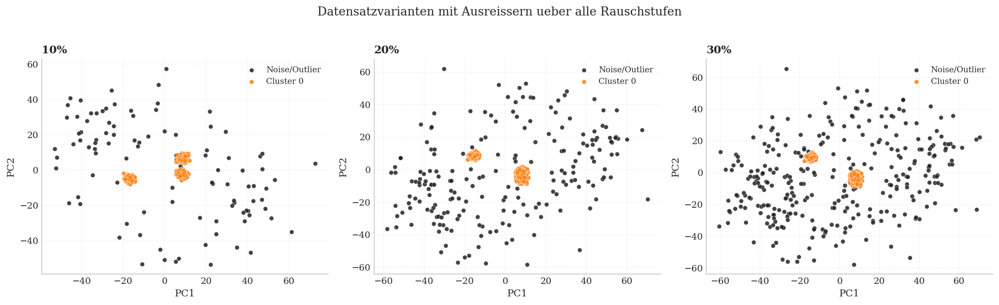

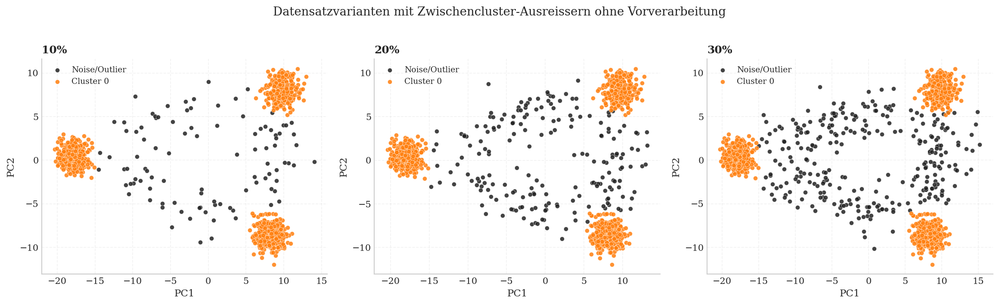

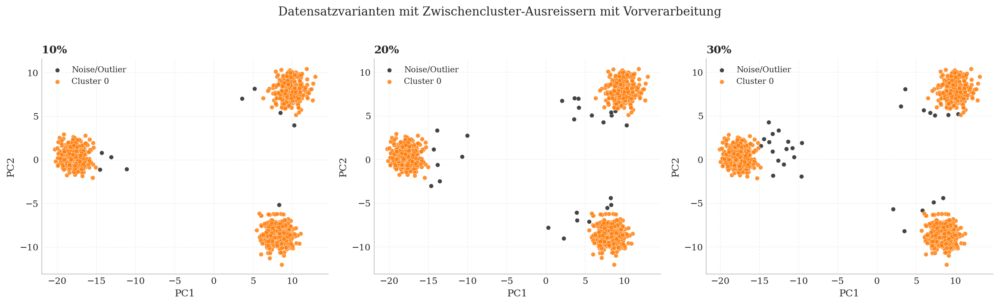

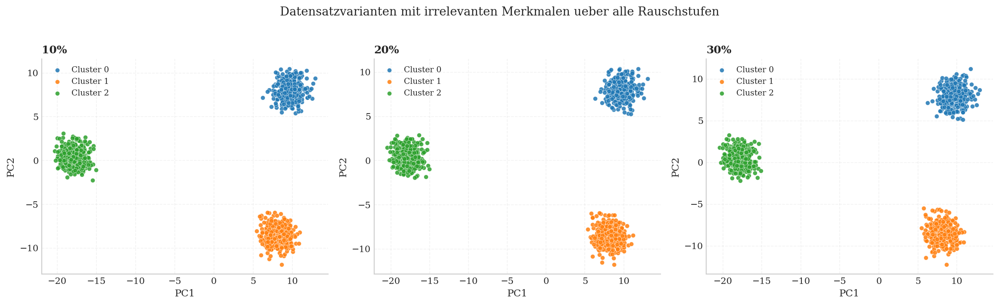

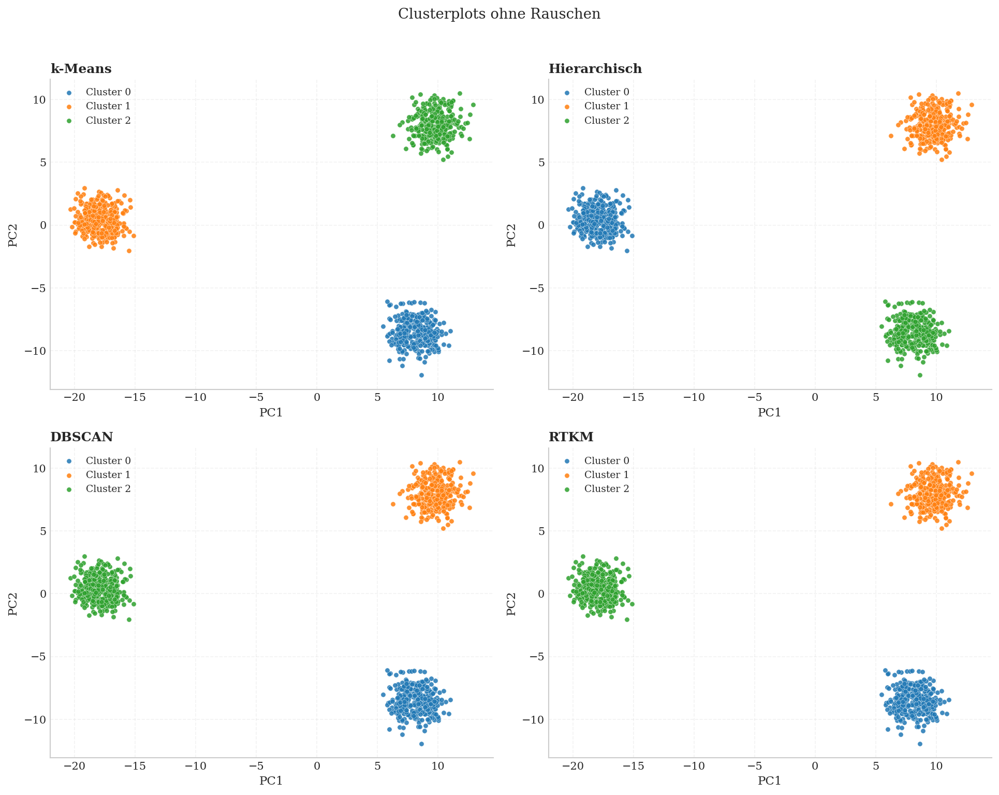

...

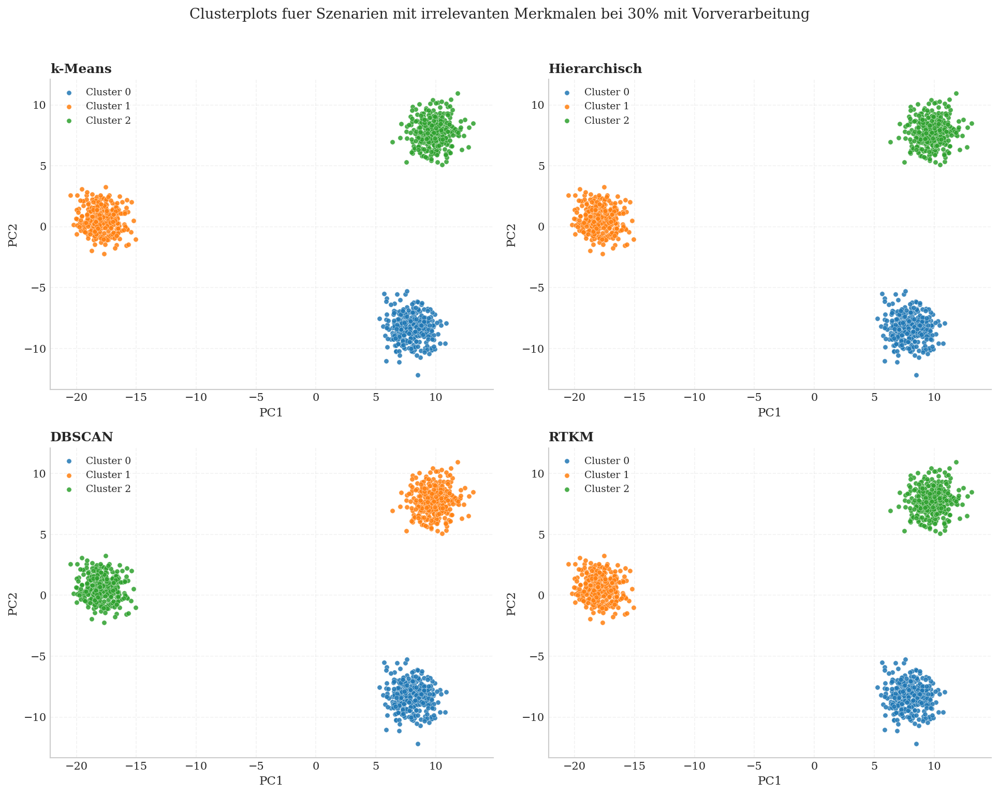

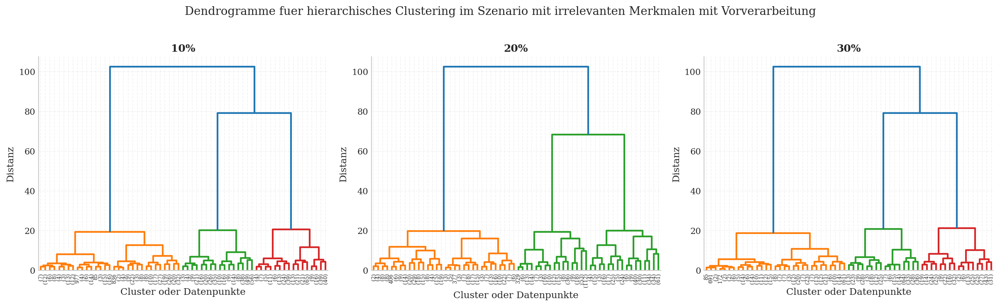

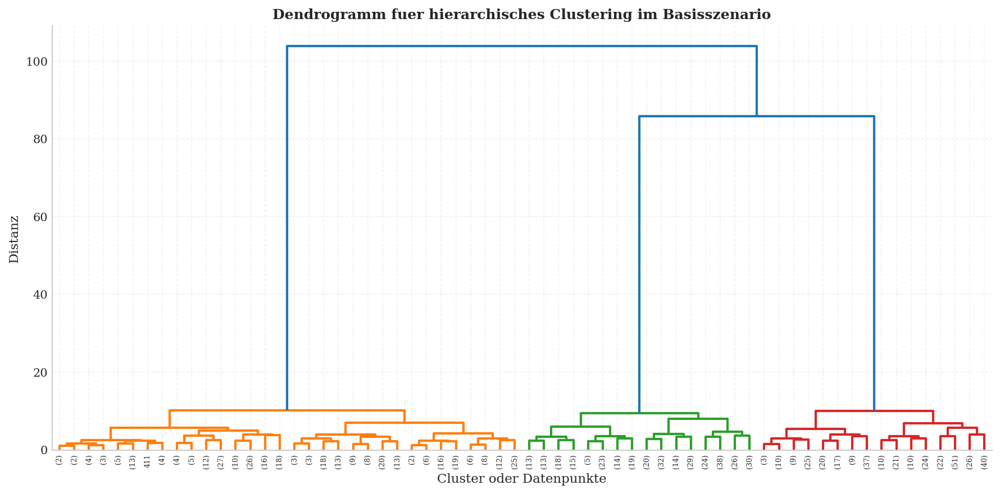

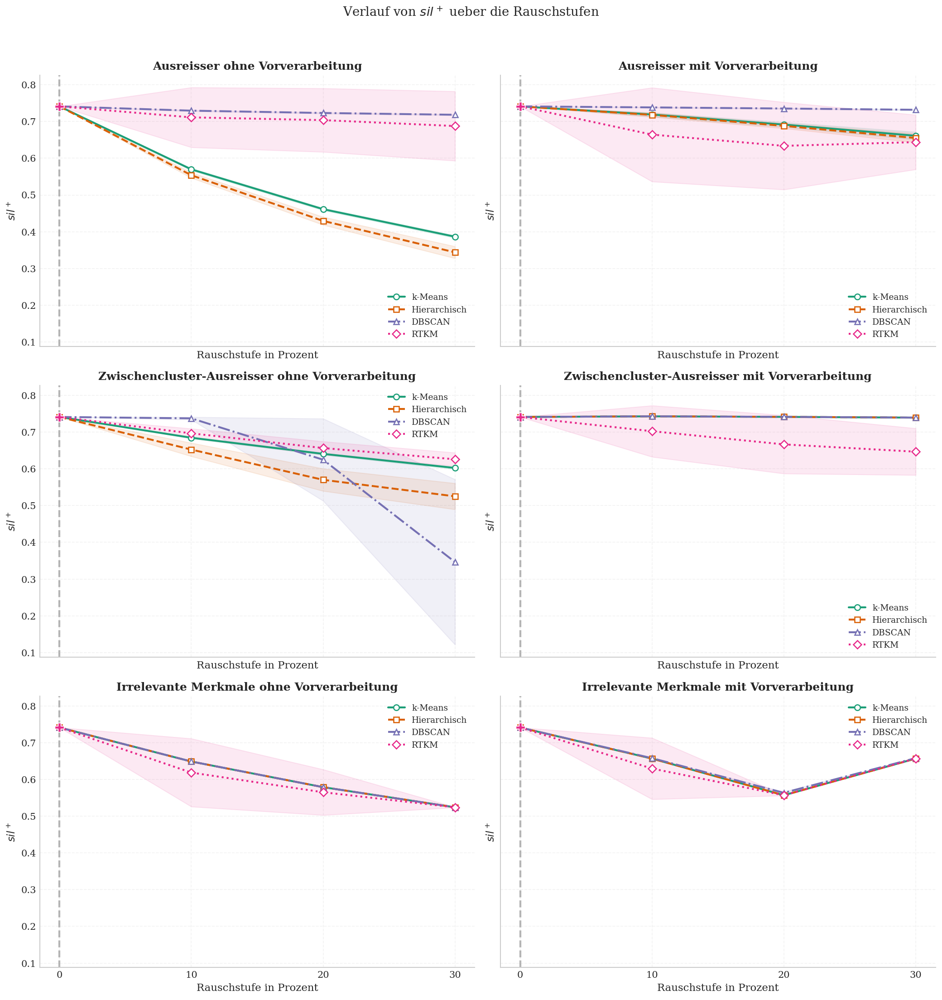

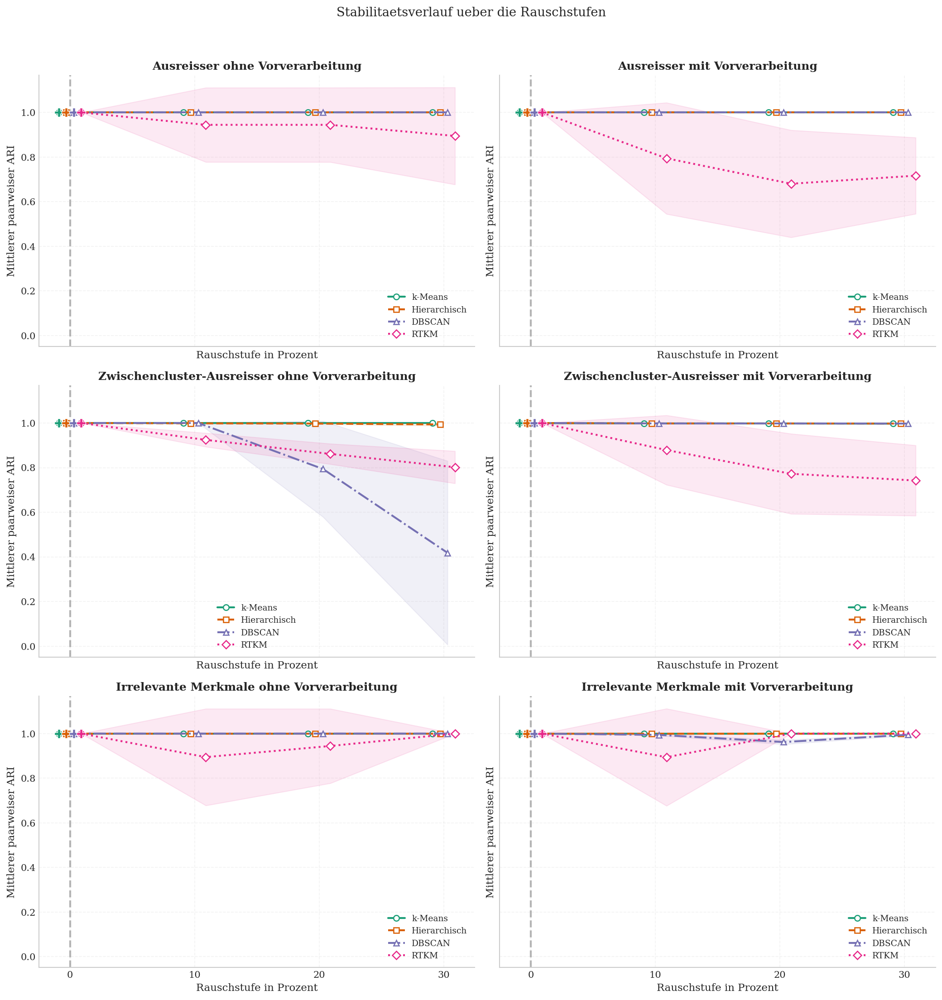

Export abgeschlossen.
Tabellen: /Users/max/workspace/clust-methods-noise-eval/results/clustering_evaluation/tables
Plots: /Users/max/workspace/clust-methods-noise-eval/results/clustering_evaluation/figures
Benchmark ohne Rauschen wurde zusaetzlich exportiert.


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,ohne_rauschen,none,0,False,dbscan,0.741137,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,190
1,ohne_rauschen,none,0,False,hierarchisch,0.741137,0.0,3.0,3.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,190
2,ohne_rauschen,none,0,False,kmeans,0.741137,0.0,3.0,3.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,190
3,ohne_rauschen,none,0,False,rtkm,0.741137,0.0,3.0,3.0,0.0,NaN,NaN,0.0,0.0,1.0,0.0,190


Exportierte getrennte Ergebnistabelle: ausreisser_ohne_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,ausreisser,10,False,dbscan,0.729517,0.001409,3.0,3.0,0.0,0.090909,0.0,0.090909,0.0,1.000000,0.000000,190
1,mit_rauschen,ausreisser,10,False,hierarchisch,0.553805,0.007282,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
2,mit_rauschen,ausreisser,10,False,kmeans,0.569782,0.003080,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
3,mit_rauschen,ausreisser,10,False,rtkm,0.711254,0.081537,3.0,3.0,0.0,NaN,NaN,0.090909,0.0,0.944447,0.166659,190
4,mit_rauschen,ausreisser,20,False,dbscan,0.723183,0.001573,3.0,3.0,0.0,0.166667,0.0,0.166667,0.0,1.000000,0.000000,190
5,mit_rauschen,ausreisser,20,False,hierarchisch,0.429492,0.010832,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
6,mit_rauschen,ausreisser,20,False,kmeans,0.461399,0.003274,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190
7,mit_rauschen,ausreisser,20,False,rtkm,0.703759,0.086494,3.0,3.0,0.0,NaN,NaN,0.166667,0.0,0.944381,0.166858,190
8,mit_rauschen,ausreisser,30,False,dbscan,0.718312,0.001326,3.0,3.0,0.0,0.230769,0.0,0.230769,0.0,1.000000,0.000000,190
9,mit_rauschen,ausreisser,30,False,hierarchisch,0.343963,0.016230,3.0,3.0,0.0,NaN,NaN,0.000000,0.0,1.000000,0.000000,190


Exportierte getrennte Ergebnistabelle: ausreisser_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,dbscan,0.738383,0.000841,3.0,3.0,0.0,0.010825,0.002532,0.010825,0.002532,1.000000,0.000000,190
1,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,hierarchisch,0.717990,0.005716,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
2,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,kmeans,0.718981,0.005135,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
3,mit_rauschen_und_vorverarbeitung,ausreisser,10,True,rtkm,0.664354,0.127822,3.0,3.0,0.0,NaN,NaN,0.090459,0.000416,0.794378,0.249552,190
4,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,dbscan,0.735337,0.001248,3.0,3.0,0.0,0.025139,0.003537,0.025139,0.003537,1.000000,0.000000,190
5,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,hierarchisch,0.688175,0.006867,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
6,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,kmeans,0.691623,0.006342,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
7,mit_rauschen_und_vorverarbeitung,ausreisser,20,True,rtkm,0.633699,0.118931,3.0,3.0,0.0,NaN,NaN,0.166601,0.000679,0.680383,0.240279,190
8,mit_rauschen_und_vorverarbeitung,ausreisser,30,True,dbscan,0.731950,0.001602,3.0,3.0,0.0,0.041928,0.005842,0.041928,0.005842,1.000000,0.000000,190
9,mit_rauschen_und_vorverarbeitung,ausreisser,30,True,hierarchisch,0.655034,0.012027,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190


Exportierte getrennte Ergebnistabelle: zwischencluster_ausreisser_ohne_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,zwischencluster_ausreisser,10,False,dbscan,0.737370,0.003447,3.0,3.0,0.000000,0.057364,0.004943,0.057364,0.004943,1.000000,0.000000,190
1,mit_rauschen,zwischencluster_ausreisser,10,False,hierarchisch,0.652278,0.018265,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,0.998533,0.002861,190
2,mit_rauschen,zwischencluster_ausreisser,10,False,kmeans,0.684549,0.002526,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
3,mit_rauschen,zwischencluster_ausreisser,10,False,rtkm,0.696570,0.012817,3.0,3.0,0.000000,NaN,NaN,0.090909,0.000000,0.924306,0.030725,190
4,mit_rauschen,zwischencluster_ausreisser,20,False,dbscan,0.624725,0.111918,2.9,2.9,0.788069,0.078625,0.015490,0.078625,0.015490,0.794149,0.214624,190
5,mit_rauschen,zwischencluster_ausreisser,20,False,hierarchisch,0.570056,0.030387,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,0.997489,0.002835,190
6,mit_rauschen,zwischencluster_ausreisser,20,False,kmeans,0.640676,0.002747,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
7,mit_rauschen,zwischencluster_ausreisser,20,False,rtkm,0.656526,0.017995,3.0,3.0,0.000000,NaN,NaN,0.166583,0.000256,0.861462,0.045751,190
8,mit_rauschen,zwischencluster_ausreisser,30,False,dbscan,0.346354,0.224881,2.4,2.4,1.046297,0.049885,0.014742,0.049885,0.014742,0.418248,0.411831,190
9,mit_rauschen,zwischencluster_ausreisser,30,False,hierarchisch,0.525139,0.035585,3.0,3.0,0.000000,NaN,NaN,0.000000,0.000000,0.993764,0.006172,190


Exportierte getrennte Ergebnistabelle: zwischencluster_ausreisser_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,dbscan,0.742903,0.000603,3.0,3.0,0.0,0.000000,0.00000,0.000000,0.000000,0.998074,0.001394,190
1,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,hierarchisch,0.742903,0.000603,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998074,0.001394,190
2,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,kmeans,0.742903,0.000603,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998074,0.001394,190
3,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,rtkm,0.702399,0.069819,3.0,3.0,0.0,NaN,NaN,0.090795,0.000648,0.878789,0.155799,190
4,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,dbscan,0.741388,0.000918,3.0,3.0,0.0,0.000000,0.00000,0.000000,0.000000,0.998045,0.001328,190
5,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,hierarchisch,0.741388,0.000918,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998045,0.001328,190
6,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,kmeans,0.741388,0.000918,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.998045,0.001328,190
7,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,20,True,rtkm,0.666485,0.079432,3.0,3.0,0.0,NaN,NaN,0.166168,0.000753,0.772408,0.179578,190
8,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,30,True,dbscan,0.739397,0.001260,3.0,3.0,0.0,0.000049,0.00022,0.000049,0.000220,0.997510,0.001671,190
9,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,30,True,hierarchisch,0.739373,0.001296,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,0.997510,0.001671,190


Exportierte getrennte Ergebnistabelle: irrelevante_merkmale_ohne_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,irrelevante_merkmale,10,False,dbscan,0.648676,0.000702,3.0,3.0,0.0,0.00005,0.000224,0.00005,0.000224,0.999850,0.000449,190
1,mit_rauschen,irrelevante_merkmale,10,False,hierarchisch,0.648620,0.000567,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
2,mit_rauschen,irrelevante_merkmale,10,False,kmeans,0.648620,0.000567,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
3,mit_rauschen,irrelevante_merkmale,10,False,rtkm,0.618510,0.092661,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,0.894501,0.216863,190
4,mit_rauschen,irrelevante_merkmale,20,False,dbscan,0.578849,0.000571,3.0,3.0,0.0,0.00000,0.000000,0.00000,0.000000,1.000000,0.000000,190
5,mit_rauschen,irrelevante_merkmale,20,False,hierarchisch,0.578849,0.000571,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
6,mit_rauschen,irrelevante_merkmale,20,False,kmeans,0.578849,0.000571,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
7,mit_rauschen,irrelevante_merkmale,20,False,rtkm,0.564976,0.062105,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,0.944395,0.166816,190
8,mit_rauschen,irrelevante_merkmale,30,False,dbscan,0.524032,0.000570,3.0,3.0,0.0,0.00000,0.000000,0.00000,0.000000,1.000000,0.000000,190
9,mit_rauschen,irrelevante_merkmale,30,False,hierarchisch,0.524032,0.000570,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190


Exportierte getrennte Ergebnistabelle: irrelevante_merkmale_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,dbscan,0.657744,0.001326,3.0,3.0,0.0,0.00195,0.001731,0.00195,0.001731,0.994170,0.003499,190
1,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,hierarchisch,0.656590,0.000661,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
2,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,kmeans,0.656590,0.000661,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
3,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,rtkm,0.629453,0.083515,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,0.894026,0.217841,190
4,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,dbscan,0.563441,0.002814,3.0,3.0,0.0,0.01285,0.004848,0.01285,0.004848,0.961945,0.009731,190
5,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,hierarchisch,0.556795,0.000820,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
6,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,kmeans,0.556795,0.000820,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
7,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,20,True,rtkm,0.556795,0.000820,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190
8,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,30,True,dbscan,0.657886,0.001592,3.0,3.0,0.0,0.00170,0.001593,0.00170,0.001593,0.994901,0.003206,190
9,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,30,True,hierarchisch,0.656658,0.000778,3.0,3.0,0.0,NaN,NaN,0.00000,0.000000,1.000000,0.000000,190


Exportierte Tabelle: intercluster_margin_threshold


,quantile,margin_threshold,k,kmeans_init,kmeans_n_init,calibration_random_state,epsilon,clean_margin_min,clean_margin_q01,clean_margin_median,clean_margin_max
0,0.01,0.737163,3,k-means++,20,42,1.000000e-12,0.544527,0.737163,0.915993,0.985273


Exportierte getrennte Ergebnistabelle: laplacian_merkmalsauswahl_irrelevante_merkmale_mit_vorverarbeitung


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,wiederholung,wiederholungs_seed,laplacian_ausgewaehlte_merkmale_mit_typ,laplacian_ausgewaehlte_standardmerkmale,laplacian_ausgewaehlte_kuenstliche_merkmale,laplacian_anzahl_standardmerkmale_ausgewaehlt,laplacian_anzahl_kuenstliche_merkmale_ausgewaehlt
0,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,1,101,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
1,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,2,102,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
2,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,3,103,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
3,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,4,104,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
4,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,5,105,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
5,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,6,106,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
6,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,7,107,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
7,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,8,108,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
8,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,9,109,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1
9,mit_rauschen_und_vorverarbeitung,irrelevante_merkmale,10,True,10,110,"feature_00 [standard], feature_01 [standard], ...","feature_00, feature_01, feature_02, feature_03...",irrelevant_01,9,1


Exportierte getrennte Ergebnistabelle: intercluster_margin_preprocessing


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,wiederholung,wiederholungs_seed,intercluster_margin_threshold,intercluster_removed_points,intercluster_removed_base_points,intercluster_removed_artificial_points,aktuelle_anzahl_beobachtungen_nach_vorverarbeitung
0,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,1,101,0.737163,101,11,90,999
1,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,2,102,0.737163,97,10,87,1003
2,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,3,103,0.737163,103,11,92,997
3,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,4,104,0.737163,102,10,92,998
4,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,5,105,0.737163,97,11,86,1003
5,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,6,106,0.737163,102,11,91,998
6,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,7,107,0.737163,105,10,95,995
7,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,8,108,0.737163,103,11,92,997
8,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,9,109,0.737163,97,11,86,1003
9,mit_rauschen_und_vorverarbeitung,zwischencluster_ausreisser,10,True,10,110,0.737163,98,11,87,1002


,scenario,rauschform,rauschstufe_prozent,vorverarbeitung,verfahren,silhouette_plus_mean,silhouette_plus_std,gefundene_cluster_mittelwert,found_clusters_mean,found_clusters_std,noise_anteil_dbscan_mittelwert,noise_anteil_dbscan_std,predicted_noise_share_mean,predicted_noise_share_std,mittlerer_paarweiser_ari,std_paarweiser_ari,anzahl_vergleiche
0,mit_rauschen,ausreisser,10,False,dbscan,0.729517,0.001409,3.0,3.0,0.0,0.090909,0.000000,0.090909,0.000000,1.000000,0.000000,190
1,mit_rauschen,ausreisser,10,False,hierarchisch,0.553805,0.007282,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
2,mit_rauschen,ausreisser,10,False,kmeans,0.569782,0.003080,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
3,mit_rauschen,ausreisser,10,False,rtkm,0.711254,0.081537,3.0,3.0,0.0,NaN,NaN,0.090909,0.000000,0.944447,0.166659,190
4,mit_rauschen,ausreisser,20,False,dbscan,0.723183,0.001573,3.0,3.0,0.0,0.166667,0.000000,0.166667,0.000000,1.000000,0.000000,190
5,mit_rauschen,ausreisser,20,False,hierarchisch,0.429492,0.010832,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
6,mit_rauschen,ausreisser,20,False,kmeans,0.461399,0.003274,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190
7,mit_rauschen,ausreisser,20,False,rtkm,0.703759,0.086494,3.0,3.0,0.0,NaN,NaN,0.166667,0.000000,0.944381,0.166858,190
8,mit_rauschen,ausreisser,30,False,dbscan,0.718312,0.001326,3.0,3.0,0.0,0.230769,0.000000,0.230769,0.000000,1.000000,0.000000,190
9,mit_rauschen,ausreisser,30,False,hierarchisch,0.343963,0.016230,3.0,3.0,0.0,NaN,NaN,0.000000,0.000000,1.000000,0.000000,190


In [7]:
def plot_metric_grid(df, metric_col, std_col, y_label, title, save_path=None, use_x_offsets=False, standardize_y_axis=True):
    layout = [
        ("ausreisser", False, "Ausreisser ohne Vorverarbeitung"),
        ("ausreisser", True, "Ausreisser mit Vorverarbeitung"),
        ("zwischencluster_ausreisser", False, "Zwischencluster-Ausreisser ohne Vorverarbeitung"),
        ("zwischencluster_ausreisser", True, "Zwischencluster-Ausreisser mit Vorverarbeitung"),
        ("irrelevante_merkmale", False, "Irrelevante Merkmale ohne Vorverarbeitung"),
        ("irrelevante_merkmale", True, "Irrelevante Merkmale mit Vorverarbeitung"),
    ]
    n_cols = 2
    n_rows = int(np.ceil(len(layout) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 4.8 * n_rows), sharex=True, sharey=standardize_y_axis)
    axes_flat = axes.ravel()
    benchmark_subset = df[df["rauschform"] == "none"].copy()
    y_axis_bounds = []

    for ax, (rauschform, vorverarbeitung, subplot_title) in zip(axes_flat, layout):
        subset = df[(df["rauschform"] == rauschform) & (df["vorverarbeitung"] == vorverarbeitung)]
        ax.axvline(0, linestyle="--", color="gray", alpha=0.6, zorder=0)
        for method_name in CONFIG["methods"]:
            benchmark_method = benchmark_subset[benchmark_subset["verfahren"] == method_name].sort_values("rauschstufe_prozent")
            noisy_subset = subset[subset["verfahren"] == method_name].sort_values("rauschstufe_prozent")
            method_subset = pd.concat([benchmark_method, noisy_subset], ignore_index=True).sort_values("rauschstufe_prozent")
            if method_subset.empty:
                continue

            x = method_subset["rauschstufe_prozent"].to_numpy(dtype=float)
            x_plot = x + (METHOD_X_OFFSETS.get(method_name, 0.0) if use_x_offsets else 0.0)
            y = method_subset[metric_col].to_numpy(dtype=float)
            yerr = method_subset[std_col].fillna(0.0).to_numpy(dtype=float)
            color = METHOD_COLORS.get(method_name, "#333333")
            marker = METHOD_MARKERS.get(method_name, "o")
            linestyle = METHOD_LINESTYLES.get(method_name, "-")
            finite_mask = np.isfinite(y)
            if np.any(finite_mask):
                y_axis_bounds.extend((y[finite_mask] - yerr[finite_mask]).tolist())
                y_axis_bounds.extend((y[finite_mask] + yerr[finite_mask]).tolist())
            if len(x_plot) > 1:
                ax.plot(
                    x_plot,
                    y,
                    marker=marker,
                    linestyle=linestyle,
                    linewidth=2,
                    color=color,
                    markersize=6,
                    markerfacecolor="white",
                    markeredgewidth=1.2,
                    label=METHOD_DISPLAY_NAMES.get(method_name, method_name),
                )
            else:
                ax.plot(
                    x_plot,
                    y,
                    marker=marker,
                    linestyle="None",
                    linewidth=0,
                    color=color,
                    markersize=6,
                    markerfacecolor="white",
                    markeredgewidth=1.2,
                    label=METHOD_DISPLAY_NAMES.get(method_name, method_name),
                )
            ax.fill_between(x_plot, y - yerr, y + yerr, alpha=0.10, color=color)
            if not benchmark_method.empty:
                benchmark_x = float(benchmark_method["rauschstufe_prozent"].iloc[0]) + (METHOD_X_OFFSETS.get(method_name, 0.0) if use_x_offsets else 0.0)
                benchmark_y = float(benchmark_method[metric_col].iloc[0])
                ax.scatter(
                    [benchmark_x],
                    [benchmark_y],
                    s=95,
                    marker="P",
                    color=color,
                    edgecolors="white",
                    linewidths=0.7,
                    zorder=7,
                )

        ax.set_title(subplot_title)
        ax.set_xlabel("Rauschstufe in Prozent")
        ax.set_ylabel(y_label)
        ax.set_xticks([0] + CONFIG["noise_levels"])
        ax.legend()

    for ax in axes_flat[len(layout):]:
        ax.axis("off")

    if standardize_y_axis:
        y_axis_bounds = np.asarray([value for value in y_axis_bounds if np.isfinite(value)], dtype=float)
        if y_axis_bounds.size > 0:
            y_min = float(np.min(y_axis_bounds))
            y_max = float(np.max(y_axis_bounds))
            y_range = y_max - y_min
            padding = 0.05 * y_range if y_range > 0 else 0.05 * max(abs(y_min), 1.0)
            for ax in axes_flat[:len(layout)]:
                ax.set_ylim(y_min - padding, y_max + padding)
                ax.ticklabel_format(axis="y", style="plain", useOffset=False)

    fig.suptitle(title, y=1.02)
    finalize_figure(fig, save_path=save_path)


def build_example_label_sets(rauschform, rauschstufe_prozent, vorverarbeitung, seed):
    variant = create_dataset_variant(rauschform, rauschstufe_prozent, vorverarbeitung, seed)
    X_scaled, _ = standardize_dataset(variant["X"])
    dbscan_params = DBSCAN_PARAMS_BY_DIM[X_scaled.shape[1]]
    rtkm_alpha = resolve_rtkm_alpha(rauschform, rauschstufe_prozent)
    label_sets = []
    hierarchical_model = None

    for method_name in CONFIG["methods"]:
        method_seed = seed + METHOD_SEED_OFFSETS[method_name]
        labels, extra = run_clustering_method(
            method_name=method_name,
            X_scaled=X_scaled,
            seed=method_seed,
            dbscan_params=dbscan_params,
            rtkm_alpha=rtkm_alpha,
            return_model=(method_name == "hierarchisch"),
        )
        if method_name == "hierarchisch":
            hierarchical_model = extra["model"]
        label_sets.append((method_name, labels))

    return variant, label_sets, hierarchical_model


example_seed = REPEAT_SEEDS[0]

def plot_dataset_variants_across_noise_levels(
    rauschform,
    title_prefix,
    filename_prefix,
    vorverarbeitung=False,
    with_outlier_overlay=False,
):
    fig, axes = plt.subplots(1, len(CONFIG["noise_levels"]), figsize=(5.2 * len(CONFIG["noise_levels"]), 4.6), squeeze=False)
    for ax, noise_level in zip(axes.ravel(), CONFIG["noise_levels"]):
        variant = create_dataset_variant(rauschform, noise_level, vorverarbeitung, example_seed)
        if with_outlier_overlay:
            labels = np.where(variant["is_base_observation"], 0, -1)
        else:
            labels = y_base[variant["observation_ids"][variant["is_base_observation"]].astype(int)]
        plot_projection(
            variant["X"],
            labels=labels,
            title=f"{noise_level}%",
            ax=ax,
        )
    fig.suptitle(title_prefix, y=1.02)
    finalize_figure(fig, save_path=make_figure_path(filename_prefix))


def plot_grouped_hierarchical_dendrograms_for_noise_levels(rauschform, vorverarbeitung, filename_prefix):
    scenario_text_by_form = {
        "ausreisser": "Ausreisser-Szenario",
        "zwischencluster_ausreisser": "Zwischencluster-Ausreisser-Szenario",
        "irrelevante_merkmale": "Szenario mit irrelevanten Merkmalen",
    }
    scenario_text = scenario_text_by_form.get(rauschform, rauschform)
    preprocessing_text = "mit Vorverarbeitung" if vorverarbeitung else "ohne Vorverarbeitung"
    dendrogram_filename = filename_prefix.replace("clusterplots_", "dendrogramm_")
    fig, axes = plt.subplots(1, len(CONFIG["noise_levels"]), figsize=(5.4 * len(CONFIG["noise_levels"]), 4.8), squeeze=False)

    for ax, noise_level in zip(axes.ravel(), CONFIG["noise_levels"]):
        _, _, hierarchical_model = build_example_label_sets(rauschform, noise_level, vorverarbeitung, example_seed)
        plot_hierarchical_dendrogram(
            hierarchical_model,
            title=f"{noise_level}%",
            truncate_mode="level",
            p=5,
            ax=ax,
        )

    fig.suptitle(
        f"Dendrogramme fuer hierarchisches Clustering im {scenario_text} {preprocessing_text}",
        y=1.02,
    )
    finalize_figure(fig, save_path=make_figure_path(dendrogram_filename))


def plot_cluster_results_for_all_noise_levels(rauschform, vorverarbeitung, filename_prefix, title_prefix):
    for noise_level in CONFIG["noise_levels"]:
        variant, label_sets, _ = build_example_label_sets(rauschform, noise_level, vorverarbeitung, example_seed)
        preprocessing_text = "mit Vorverarbeitung" if vorverarbeitung else "ohne Vorverarbeitung"
        plot_cluster_comparison(
            variant["X"],
            label_sets,
            title=f"{title_prefix} bei {noise_level}% {preprocessing_text}",
            save_path=make_figure_path(f"{filename_prefix}_{noise_level}prozent"),
        )


plot_dataset_variants_across_noise_levels(
    rauschform="ausreisser",
    title_prefix="Datensatzvarianten mit Ausreissern ueber alle Rauschstufen",
    filename_prefix="datensatzvarianten_ausreisser_alle_rauschstufen",
    vorverarbeitung=False,
    with_outlier_overlay=True,
)

plot_dataset_variants_across_noise_levels(
    rauschform="zwischencluster_ausreisser",
    title_prefix="Datensatzvarianten mit Zwischencluster-Ausreissern ohne Vorverarbeitung",
    filename_prefix="datensatzvarianten_zwischencluster_ausreisser_ohne_vorverarbeitung_alle_rauschstufen",
    vorverarbeitung=False,
    with_outlier_overlay=True,
)

plot_dataset_variants_across_noise_levels(
    rauschform="zwischencluster_ausreisser",
    title_prefix="Datensatzvarianten mit Zwischencluster-Ausreissern mit Vorverarbeitung",
    filename_prefix="datensatzvarianten_zwischencluster_ausreisser_mit_vorverarbeitung_alle_rauschstufen",
    vorverarbeitung=True,
    with_outlier_overlay=True,
)

plot_dataset_variants_across_noise_levels(
    rauschform="irrelevante_merkmale",
    title_prefix="Datensatzvarianten mit irrelevanten Merkmalen ueber alle Rauschstufen",
    filename_prefix="datensatzvarianten_irrelevante_merkmale_alle_rauschstufen",
    vorverarbeitung=False,
    with_outlier_overlay=False,
)

baseline_variant, baseline_label_sets, baseline_hierarchical_model = build_example_label_sets("none", 0, False, example_seed)
plot_cluster_comparison(
    baseline_variant["X"],
    baseline_label_sets,
    title="Clusterplots ohne Rauschen",
    save_path=make_figure_path("clusterplots_ohne_rauschen"),
)

plot_cluster_results_for_all_noise_levels(
    rauschform="ausreisser",
    vorverarbeitung=False,
    filename_prefix="clusterplots_ausreisser_ohne_vorverarbeitung",
    title_prefix="Clusterplots fuer Ausreisser-Szenarien",
)
plot_grouped_hierarchical_dendrograms_for_noise_levels(
    rauschform="ausreisser",
    vorverarbeitung=False,
    filename_prefix="clusterplots_ausreisser_ohne_vorverarbeitung",
)

plot_cluster_results_for_all_noise_levels(
    rauschform="ausreisser",
    vorverarbeitung=True,
    filename_prefix="clusterplots_ausreisser_mit_vorverarbeitung",
    title_prefix="Clusterplots fuer Ausreisser-Szenarien",
)
plot_grouped_hierarchical_dendrograms_for_noise_levels(
    rauschform="ausreisser",
    vorverarbeitung=True,
    filename_prefix="clusterplots_ausreisser_mit_vorverarbeitung",
)

plot_cluster_results_for_all_noise_levels(
    rauschform="zwischencluster_ausreisser",
    vorverarbeitung=False,
    filename_prefix="clusterplots_zwischencluster_ausreisser_ohne_vorverarbeitung",
    title_prefix="Clusterplots fuer Zwischencluster-Ausreisser-Szenarien",
)
plot_grouped_hierarchical_dendrograms_for_noise_levels(
    rauschform="zwischencluster_ausreisser",
    vorverarbeitung=False,
    filename_prefix="clusterplots_zwischencluster_ausreisser_ohne_vorverarbeitung",
)

plot_cluster_results_for_all_noise_levels(
    rauschform="zwischencluster_ausreisser",
    vorverarbeitung=True,
    filename_prefix="clusterplots_zwischencluster_ausreisser_mit_vorverarbeitung",
    title_prefix="Clusterplots fuer Zwischencluster-Ausreisser-Szenarien",
)
plot_grouped_hierarchical_dendrograms_for_noise_levels(
    rauschform="zwischencluster_ausreisser",
    vorverarbeitung=True,
    filename_prefix="clusterplots_zwischencluster_ausreisser_mit_vorverarbeitung",
)

plot_cluster_results_for_all_noise_levels(
    rauschform="irrelevante_merkmale",
    vorverarbeitung=False,
    filename_prefix="clusterplots_irrelevante_merkmale_ohne_vorverarbeitung",
    title_prefix="Clusterplots fuer Szenarien mit irrelevanten Merkmalen",
)
plot_grouped_hierarchical_dendrograms_for_noise_levels(
    rauschform="irrelevante_merkmale",
    vorverarbeitung=False,
    filename_prefix="clusterplots_irrelevante_merkmale_ohne_vorverarbeitung",
)

plot_cluster_results_for_all_noise_levels(
    rauschform="irrelevante_merkmale",
    vorverarbeitung=True,
    filename_prefix="clusterplots_irrelevante_merkmale_mit_vorverarbeitung",
    title_prefix="Clusterplots fuer Szenarien mit irrelevanten Merkmalen",
)
plot_grouped_hierarchical_dendrograms_for_noise_levels(
    rauschform="irrelevante_merkmale",
    vorverarbeitung=True,
    filename_prefix="clusterplots_irrelevante_merkmale_mit_vorverarbeitung",
)

plot_hierarchical_dendrogram(
    baseline_hierarchical_model,
    title="Dendrogramm fuer hierarchisches Clustering im Basisszenario",
    truncate_mode="level",
    p=5,
    save_path=make_figure_path("dendrogramm_basisszenario"),
)

plot_metric_grid(
    aggregated_results,
    metric_col="silhouette_plus_mean",
    std_col="silhouette_plus_std",
    y_label=r"$sil^+$",
    title=r"Verlauf von $sil^+$ ueber die Rauschstufen",
    save_path=make_figure_path("verlauf_sil_plus"),
    use_x_offsets=False,
)

plot_metric_grid(
    aggregated_results,
    metric_col="mittlerer_paarweiser_ari",
    std_col="std_paarweiser_ari",
    y_label="Mittlerer paarweiser ARI",
    title="Stabilitaetsverlauf ueber die Rauschstufen",
    save_path=make_figure_path("verlauf_stabilitaet_ari"),
    use_x_offsets=True,
)


def safe_version(package_name):
    try:
        return importlib_metadata.version(package_name)
    except importlib_metadata.PackageNotFoundError:
        return "nicht_verfuegbar"


package_versions = {
    package: safe_version(package)
    for package in ["numpy", "pandas", "matplotlib", "scipy", "scikit-learn"]
}

run_metadata = {
    "config": CONFIG,
    "repeat_seeds": REPEAT_SEEDS,
    "dbscan_parameter_pro_dimensionalitaet": dbscan_calibration_records,
    "intercluster_margin_kalibrierung": intercluster_margin_threshold_record,
    "package_versions": package_versions,
}

raw_results.to_csv(TABLES_DIR / "rohergebnisse.csv", index=False)
stability_results.to_csv(TABLES_DIR / "stabilitaet.csv", index=False)
aggregated_results.to_csv(TABLES_DIR / "aggregierte_ergebnisse.csv", index=False)
benchmark_results.to_csv(TABLES_DIR / "benchmark_ohne_rauschen.csv", index=False)
for table_name, table_df in separated_result_tables.items():
    table_df.to_csv(TABLES_DIR / f"aggregierte_ergebnisse_{table_name}.csv", index=False)
laplacian_feature_selection_results.to_csv(
    TABLES_DIR / "laplacian_merkmalsauswahl_irrelevante_merkmale_mit_vorverarbeitung.csv",
    index=False,
)
intercluster_margin_threshold_df.to_csv(
    TABLES_DIR / "intercluster_margin_threshold.csv",
    index=False,
)
intercluster_margin_preprocessing_results.to_csv(
    TABLES_DIR / "intercluster_margin_preprocessing.csv",
    index=False,
)
base_observation_metadata.to_csv(TABLES_DIR / "basis_beobachtungen.csv", index=False)
base_feature_metadata.to_csv(TABLES_DIR / "basis_merkmale.csv", index=False)
dbscan_calibration_df.to_csv(TABLES_DIR / "dbscan_kalibrierung.csv", index=False)

with open(RESULTS_DIR / "run_metadata.json", "w", encoding="utf-8") as file:
    json.dump(run_metadata, file, indent=2)

print("Export abgeschlossen.")
print(f"Tabellen: {TABLES_DIR}")
print(f"Plots: {FIGURES_DIR}")
print("Benchmark ohne Rauschen wurde zusaetzlich exportiert.")
display(benchmark_results)
for table_name, table_df in separated_result_tables.items():
    print(f"Exportierte getrennte Ergebnistabelle: {table_name}")
    display(table_df)
print("Exportierte Tabelle: intercluster_margin_threshold")
display(intercluster_margin_threshold_df)
print("Exportierte getrennte Ergebnistabelle: laplacian_merkmalsauswahl_irrelevante_merkmale_mit_vorverarbeitung")
display(laplacian_feature_selection_results)
print("Exportierte getrennte Ergebnistabelle: intercluster_margin_preprocessing")
display(intercluster_margin_preprocessing_results)
aggregated_results_display.head(24)
